<a href="https://colab.research.google.com/github/keutzer/Tibetan_Book_Cropping2/blob/master/BONPO_ABHISEKA_TEXTS_right.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%load_ext autoreload
%autoreload 2

# import packages and set directory



In [0]:
# acqure the authorization of the google drive, so that we could read from it and save cropped images to it
import os
from google.colab import drive
drive.mount('/content/gdrive')
os.chdir("/content/gdrive/My Drive/Kurt's/Tibetan-Cropping/BONPO ABHISEKA TEXTS/right side") #Change the path to the directory that contains all code and data

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [0]:
# Create a diretory to save cropped images
!mkdir  ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side
# Create list.txt that contains the list of images to be cropped
!touch list.txt
!ls *.jpg > list.txt

In [0]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
from scipy.cluster.vq import whiten
import cv2 as cv

## Input your image information

In [0]:
# output path
path = "../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side"
image_list = [] # all the images to be cropped
failed_list = [] # if any cropping fails, add it to failed_list for later cropping
# add all the cropping images to the image_list
with open("list.txt","r") as f:
  for image_name in f:
    name = image_name[:-1]
    image_list.append(name)

image_list = sorted(image_list)
print(image_list)


# hyperparameters
threshold = 2
rows = 10
tol = 125 # the cropped image should has height larger than tol, 
          # otherwise, we decline this cropping and move on to the next cropping
mean_height = 300


  # img = cv.imread(image_name)
  # # dst = cv.fastNlMeansDenoisingColored(img,None,10,10,7,21)
  # im = Image.fromarray(img)
  # print(im.size)

['Copy of image00003.jpg', 'image00001.jpg', 'image00002.jpg', 'image00003.jpg', 'image00004.jpg', 'image00005.jpg', 'image00006.jpg', 'image00007.jpg', 'image00008.jpg', 'image00009.jpg', 'image00010.jpg', 'image00011.jpg', 'image00012.jpg', 'image00013.jpg', 'image00014.jpg', 'image00015.jpg', 'image00016.jpg', 'image00017.jpg', 'image00018.jpg', 'image00019.jpg', 'image00020.jpg', 'image00021.jpg', 'image00022.jpg', 'image00023.jpg', 'image00024.jpg', 'image00025.jpg', 'image00026.jpg', 'image00027.jpg', 'image00028.jpg', 'image00029.jpg', 'image00030.jpg', 'image00031.jpg', 'image00032.jpg', 'image00033.jpg', 'image00034.jpg', 'image00035.jpg', 'image00036.jpg', 'image00037.jpg', 'image00038.jpg', 'image00039.jpg', 'image00040.jpg', 'image00041.jpg', 'image00042.jpg', 'image00043.jpg', 'image00044.jpg', 'image00045.jpg', 'image00046.jpg', 'image00047.jpg', 'image00048.jpg', 'image00049.jpg', 'image00050.jpg', 'image00051.jpg', 'image00052.jpg', 'image00053.jpg', 'image00054.jpg', '

## crop funcion

In [0]:
def cut_image(im, bound, image_name, image_index):
  # crop and print the cropped image
  print(bound)
  new_image = im.crop(bound)
  plt.imshow(new_image)
  plt.title("cut")
  plt.show()
  # save the image
  try:
    if not os.path.exists(path):
      os.mkdir(path)
      print("Created directory", path)
    output_path = os.path.join(path, image_name+"-%s.jpg" % image_index)
    new_image.save(output_path)
    print("Saved Image as", output_path, "!!!")
    return True
  except:
    if image_name not in failed_list:
      failed_list.append(image_name)
    print("ERROR: check your path")
    return False

def find_bound(image, img, threshold = None):
  bound_list = []
  height = len(image) 
  width = len(image[0]) 
  # border of next cutting
  left, upper, right, lower = 0, 0, width, 0 
  start = False # This indicates if we have started a new cropping. 

  # Compute the mean of each row
  mean_list = []
  plt.imshow(image)
  plt.title("before")
  plt.show()
  img_1 = img.crop((200, 0, width-200, height)) 
  img_1 = np.array(img_1)

  thresh_num_list = {}
  thresh_total_list = {}
  for i in range(len(image)):
    mean_temp = 255 - np.mean(img_1[i][0:-20], axis=0)
    mean_list.append(mean_temp)
    if np.logical_and(1 < mean_temp, mean_temp < 5):
      if int(mean_temp) not in thresh_num_list:
        thresh_num_list[int(mean_temp)] = 1
        thresh_total_list[int(mean_temp)] = mean_temp
      else: 
        thresh_num_list[int(mean_temp)] += 1
        thresh_total_list[int(mean_temp)] += mean_temp

  print(thresh_num_list)
  mean_key = min(thresh_num_list, key = thresh_num_list.get) 
  if not threshold:
    threshold = thresh_total_list[mean_key] / thresh_num_list[mean_key]
  print("threshold", threshold)

  # mean_avg = np.mean(mean_list)
  # mean_std = np.std(mean_list)
  # print(mean_avg, mean_std)
  
  # Computer the average of i-th to (i + rows)-th rows
  # if the average is greater than the threshold, then they are characters; otherwise, white space
  for i in range(len(image))[rows:-rows]:
    avg = np.mean(mean_list[i-rows:i+rows]) # compute the average of rows
    # print(i, avg)
    if avg > threshold and not start:
      # We find characters, so we start a new cutting here
      # initalize the upper and lower, and set start to True
      upper, lower = i, i
      start = True
    elif (avg <= threshold or i + rows == height - 1) and start:
      # If we find a white space, we crop the image. If we reach the bottom of the image, we also crop the image.
      # Cut the image using left, upper, right and lower, and also set the start to False
      start = False
      if lower - upper < tol or lower < 10:  
        continue
      bound = [left, upper, right, lower]
      print(bound)
      bound_list.append(bound)
    elif avg > threshold and start:
      # We find characters, and the cropping has started, then we increase the lower, we move to the next row
      lower += 1
  # TODO: compute mean and replace 50.0 
  return adjust_bound(bound_list, height)

def adjust_bound(bound_list, height):
  if len(bound_list) <= 1:
    return bound_list

  border_total = 0
  num = 0
  for i in range(len(bound_list) - 1):
    diff = bound_list[i + 1][1] - bound_list[i][3]
    if diff < 150:
      border_total += diff
      num += 1
  if num > 0:
    border = border_total / num
  else:
    border = 100.0

  border = border * 2 / 3

  for i in range(len(bound_list) - 1):
    prev = bound_list[i]
    curr = bound_list[i + 1]
    prev[3] = prev[3] + border
    curr[1] = curr[1] - border
  bound_list[-1][3] = min(bound_list[-1][3] + border, float(height - 1))
  
  if bound_list[0] !=0 and (bound_list[0][3] - bound_list[0][1]) < mean_height:
    bound_list[0][1] -= (mean_height - (bound_list[0][3] - bound_list[0][1]))
    bound_list[0][1] = max(0, bound_list[0][1])

  return bound_list

def crop(im, image_name, threshold = None):
  # check input
  print("Processing", image_name)
  if im == None:
    print("ERROR: image cannot be None")
    return
  image_index = 0 

  # preprocessing of input images
  image = np.array(im)
  whiten(image)
  # find the bound of each piece
  bound_list = find_bound(image, im, threshold)
  # cut and save
  for bound in bound_list:
    if cut_image(im, bound, image_name, image_index):
      image_index += 1
    
  # fail detect: if an image is cut into less than 3 images,
  # we think something went wrong with the cropping,
  # this condition could be changed according to your demand
  if image_index < 3 and image_name not in failed_list:
    print(image_name, "Failed")
    failed_list.append(image_name)

Copy of image00003.jpg
(3379, 2610)
Processing Copy of image00003


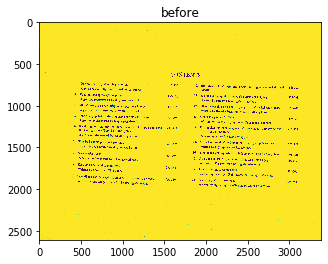

{4: 54, 2: 52, 1: 39, 3: 59}
threshold 2
[0, 1549, 3379, 1982]
[0, 1549, 3379, 1982]


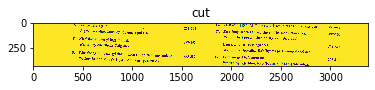

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/Copy of image00003-0.jpg !!!
Copy of image00003 Failed
image00001.jpg
(3365, 2631)
Processing image00001


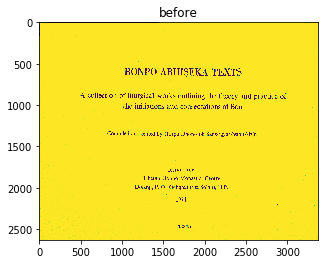

{2: 23, 3: 50, 1: 16, 4: 34}
threshold 2
image00001 Failed
image00002.jpg
(3377, 2623)
Processing image00002


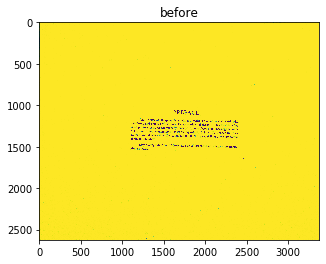

{1: 12, 3: 15, 2: 17, 4: 9}
threshold 2
[0, 1163, 3377, 1425]
[0, 1163, 3377, 1425]


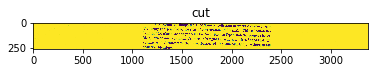

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00002-0.jpg !!!
image00002 Failed
image00003.jpg
(3379, 2610)
Processing image00003


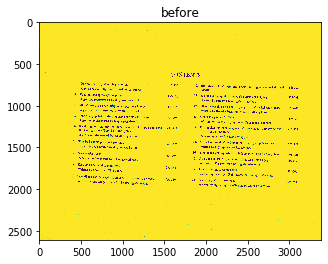

{4: 54, 2: 52, 1: 39, 3: 59}
threshold 2
[0, 1549, 3379, 1982]
[0, 1549, 3379, 1982]


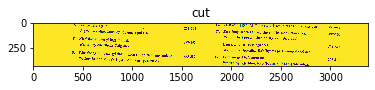

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00003-0.jpg !!!
image00003 Failed
image00004.jpg
(3400, 2614)
Processing image00004


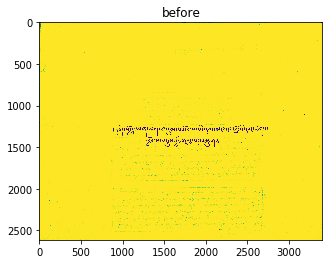

{4: 46, 1: 302, 3: 80, 2: 120}
threshold 2
[0, 1228, 3400, 1502]
[0, 1228, 3400, 1502]


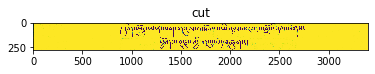

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00004-0.jpg !!!
image00004 Failed
image00005.jpg
(3412, 2633)
Processing image00005


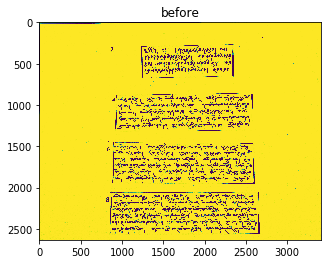

{2: 15, 3: 12, 4: 12, 1: 21}
threshold 2
[0, 264, 3412, 638]
[0, 855, 3412, 1329]
[0, 1447, 3412, 1960]
[0, 2046, 3412, 2574]
[0, 264, 3412, 706.0]


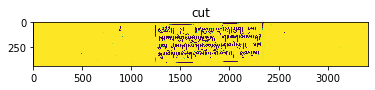

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00005-0.jpg !!!
[0, 787.0, 3412, 1397.0]


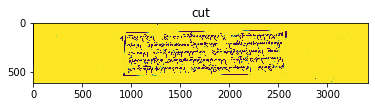

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00005-1.jpg !!!
[0, 1379.0, 3412, 2028.0]


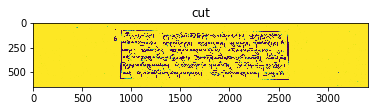

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00005-2.jpg !!!
[0, 1978.0, 3412, 2632.0]


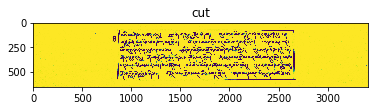

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00005-3.jpg !!!
image00006.jpg
(3406, 2636)
Processing image00006


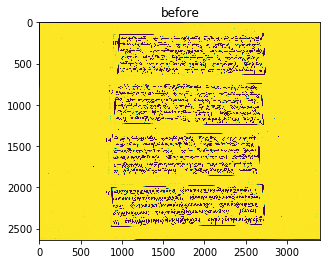

{2: 26, 1: 23, 3: 15, 4: 21}
threshold 2
[0, 131, 3406, 654]
[0, 727, 3406, 1252]
[0, 1335, 3406, 1873]
[0, 1957, 3406, 2482]
[0, 131, 3406, 707.3333333333334]


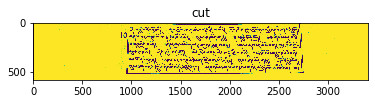

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00006-0.jpg !!!
[0, 673.6666666666666, 3406, 1305.3333333333333]


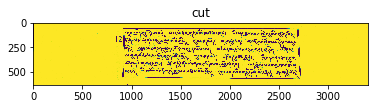

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00006-1.jpg !!!
[0, 1281.6666666666667, 3406, 1926.3333333333333]


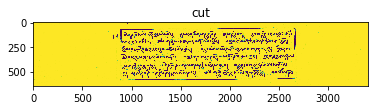

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00006-2.jpg !!!
[0, 1903.6666666666667, 3406, 2535.3333333333335]


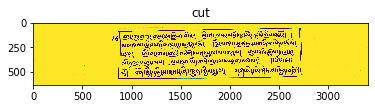

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00006-3.jpg !!!
image00007.jpg
(3403, 2605)
Processing image00007


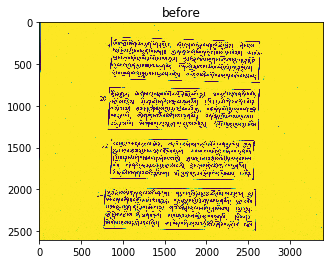

{2: 11, 1: 19, 3: 8, 4: 6}
threshold 2
[0, 174, 3403, 730]
[0, 774, 3403, 1299]
[0, 1391, 3403, 1897]
[0, 1973, 3403, 2497]
[0, 174, 3403, 777.1111111111111]


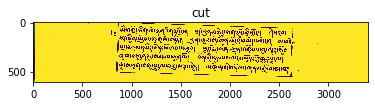

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00007-0.jpg !!!
[0, 726.8888888888889, 3403, 1346.111111111111]


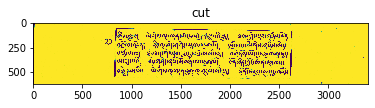

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00007-1.jpg !!!
[0, 1343.888888888889, 3403, 1944.111111111111]


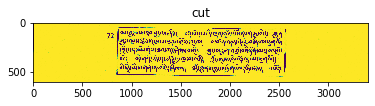

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00007-2.jpg !!!
[0, 1925.888888888889, 3403, 2544.1111111111113]


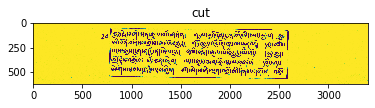

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00007-3.jpg !!!
image00008.jpg
(3402, 2606)
Processing image00008


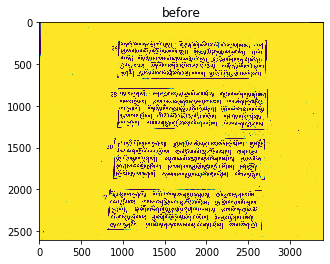

{1: 47, 4: 16, 3: 12, 2: 12}
threshold 2
[0, 203, 3402, 686]
[0, 784, 3402, 1296]
[0, 1374, 3402, 1890]
[0, 1989, 3402, 2500]
[0, 203, 3402, 747.1111111111111]


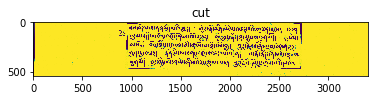

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00008-0.jpg !!!
[0, 722.8888888888889, 3402, 1357.111111111111]


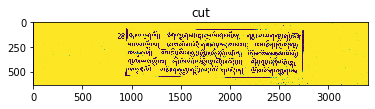

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00008-1.jpg !!!
[0, 1312.888888888889, 3402, 1951.111111111111]


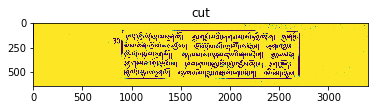

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00008-2.jpg !!!
[0, 1927.888888888889, 3402, 2561.1111111111113]


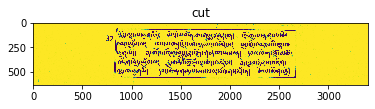

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00008-3.jpg !!!
image00009.jpg
(3394, 2615)
Processing image00009


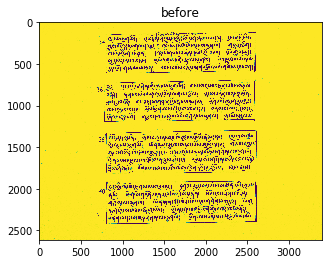

{1: 8, 4: 4, 3: 1}
threshold 2
[0, 116, 3394, 622]
[0, 688, 3394, 1201]
[0, 1292, 3394, 1825]
[0, 1898, 3394, 2430]
[0, 116, 3394, 673.1111111111111]


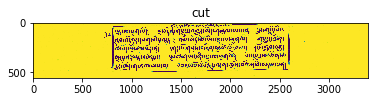

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00009-0.jpg !!!
[0, 636.8888888888889, 3394, 1252.111111111111]


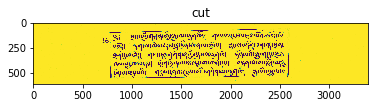

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00009-1.jpg !!!
[0, 1240.888888888889, 3394, 1876.111111111111]


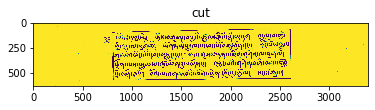

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00009-2.jpg !!!
[0, 1846.888888888889, 3394, 2481.1111111111113]


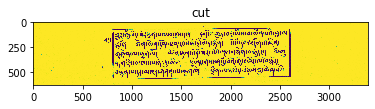

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00009-3.jpg !!!
image00010.jpg
(3388, 2629)
Processing image00010


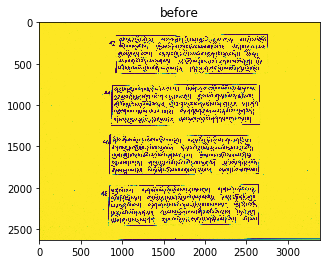

{4: 15, 3: 8, 2: 8, 1: 5}
threshold 2
[0, 140, 3388, 634]
[0, 742, 3388, 1259]
[0, 1350, 3388, 1850]
[0, 1951, 3388, 2470]
[0, 140, 3388, 700.6666666666666]


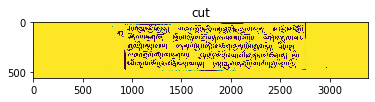

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00010-0.jpg !!!
[0, 675.3333333333334, 3388, 1325.6666666666667]


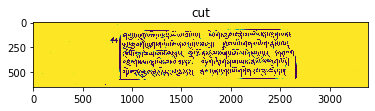

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00010-1.jpg !!!
[0, 1283.3333333333333, 3388, 1916.6666666666667]


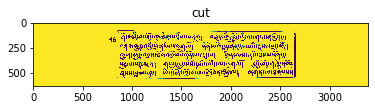

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00010-2.jpg !!!
[0, 1884.3333333333333, 3388, 2536.6666666666665]


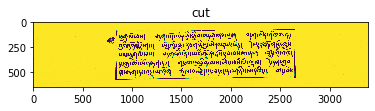

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00010-3.jpg !!!
image00011.jpg
(3390, 2605)
Processing image00011


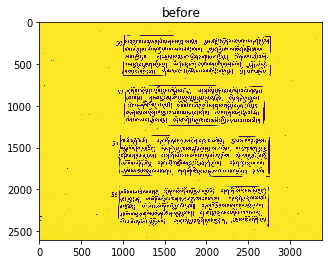

{1: 20, 3: 12, 2: 5, 4: 18}
threshold 2
[0, 150, 3390, 658]
[0, 748, 3390, 1251]
[0, 1342, 3390, 1861]
[0, 1950, 3390, 2450]
[0, 150, 3390, 718.0]


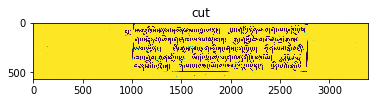

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00011-0.jpg !!!
[0, 688.0, 3390, 1311.0]


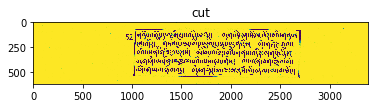

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00011-1.jpg !!!
[0, 1282.0, 3390, 1921.0]


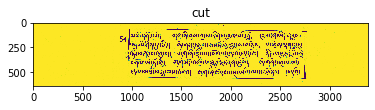

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00011-2.jpg !!!
[0, 1890.0, 3390, 2510.0]


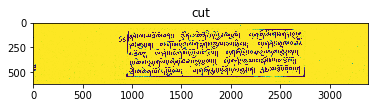

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00011-3.jpg !!!
image00012.jpg
(3391, 2623)
Processing image00012


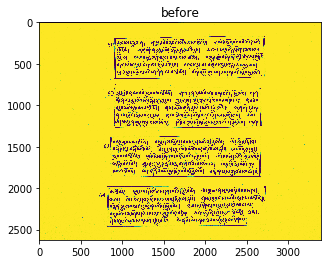

{4: 21, 2: 18, 3: 16, 1: 18}
threshold 2
[0, 161, 3391, 690]
[0, 782, 3391, 1283]
[0, 1361, 3391, 1869]
[0, 1961, 3391, 2469]
[0, 161, 3391, 748.2222222222222]


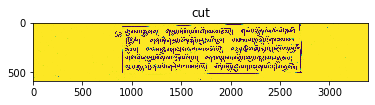

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00012-0.jpg !!!
[0, 723.7777777777778, 3391, 1341.2222222222222]


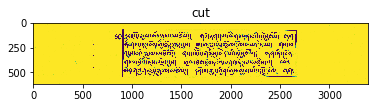

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00012-1.jpg !!!
[0, 1302.7777777777778, 3391, 1927.2222222222222]


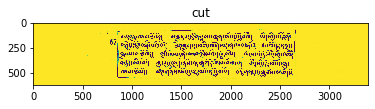

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00012-2.jpg !!!
[0, 1902.7777777777778, 3391, 2527.222222222222]


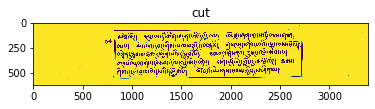

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00012-3.jpg !!!
image00013.jpg
(3391, 2611)
Processing image00013


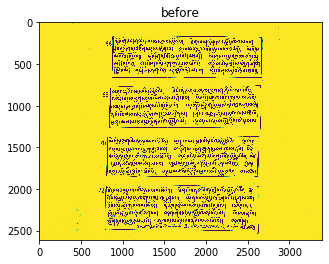

{1: 66, 4: 14, 3: 5, 2: 17}
threshold 2
[0, 159, 3391, 637]
[0, 752, 3391, 1250]
[0, 1354, 3391, 1864]
[0, 1950, 3391, 2514]
[0, 159, 3391, 704.7777777777778]


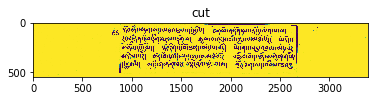

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00013-0.jpg !!!
[0, 684.2222222222222, 3391, 1317.7777777777778]


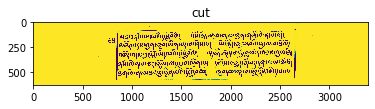

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00013-1.jpg !!!
[0, 1286.2222222222222, 3391, 1931.7777777777778]


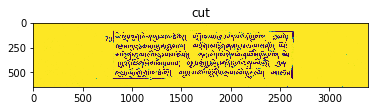

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00013-2.jpg !!!
[0, 1882.2222222222222, 3391, 2581.777777777778]


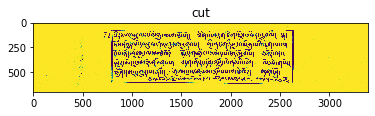

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00013-3.jpg !!!
image00014.jpg
(3391, 2604)
Processing image00014


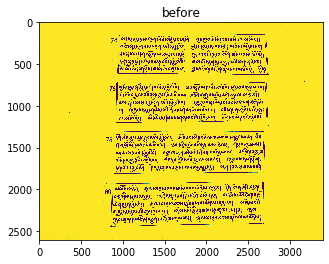

{2: 13, 3: 14, 1: 31, 4: 30}
threshold 2
[0, 133, 3391, 637]
[0, 706, 3391, 1210]
[0, 1326, 3391, 1820]
[0, 1902, 3391, 2449]
[0, 133, 3391, 696.3333333333334]


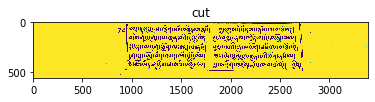

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00014-0.jpg !!!
[0, 646.6666666666666, 3391, 1269.3333333333333]


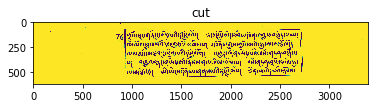

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00014-1.jpg !!!
[0, 1266.6666666666667, 3391, 1879.3333333333333]


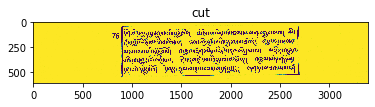

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00014-2.jpg !!!
[0, 1842.6666666666667, 3391, 2508.3333333333335]


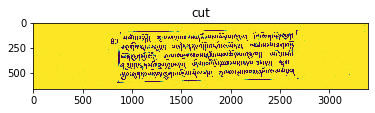

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00014-3.jpg !!!
image00015.jpg
(3383, 2601)
Processing image00015


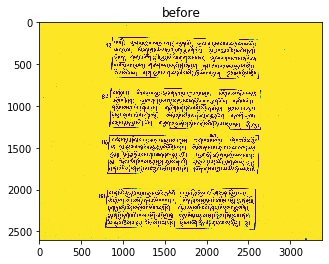

{1: 9, 3: 21, 2: 7, 4: 22}
threshold 2
[0, 173, 3383, 688]
[0, 777, 3383, 1292]
[0, 1342, 3383, 1826]
[0, 1977, 3383, 2482]
[0, 173, 3383, 734.3333333333334]


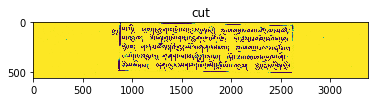

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00015-0.jpg !!!
[0, 730.6666666666666, 3383, 1338.3333333333333]


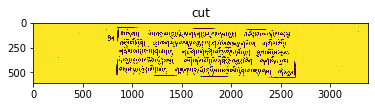

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00015-1.jpg !!!
[0, 1295.6666666666667, 3383, 1872.3333333333333]


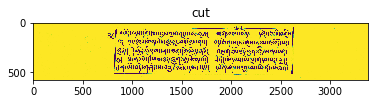

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00015-2.jpg !!!
[0, 1930.6666666666667, 3383, 2528.3333333333335]


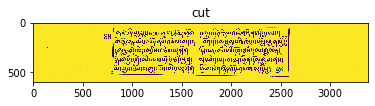

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00015-3.jpg !!!
image00016.jpg
(3380, 2602)
Processing image00016


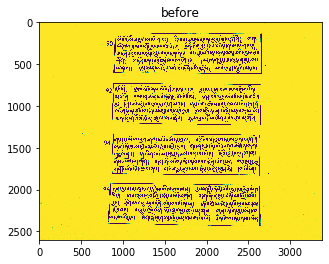

{2: 14, 1: 25, 3: 18, 4: 18}
threshold 2
[0, 122, 3380, 625]
[0, 724, 3380, 1238]
[0, 1324, 3380, 1834]
[0, 1915, 3380, 2444]
[0, 122, 3380, 684.1111111111111]


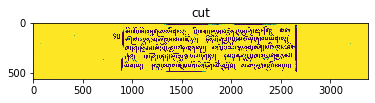

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00016-0.jpg !!!
[0, 664.8888888888889, 3380, 1297.111111111111]


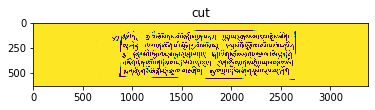

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00016-1.jpg !!!
[0, 1264.888888888889, 3380, 1893.111111111111]


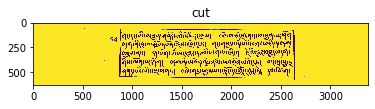

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00016-2.jpg !!!
[0, 1855.888888888889, 3380, 2503.1111111111113]


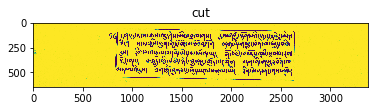

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00016-3.jpg !!!
image00017.jpg
(3379, 2601)
Processing image00017


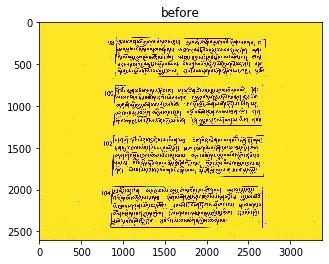

{2: 17, 3: 14, 4: 14, 1: 42}
threshold 2
[0, 171, 3379, 666]
[0, 741, 3379, 1251]
[0, 1337, 3379, 1853]
[0, 1947, 3379, 2464]
[0, 171, 3379, 722.6666666666666]


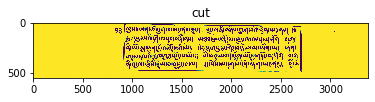

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00017-0.jpg !!!
[0, 684.3333333333334, 3379, 1307.6666666666667]


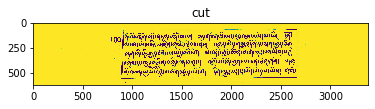

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00017-1.jpg !!!
[0, 1280.3333333333333, 3379, 1909.6666666666667]


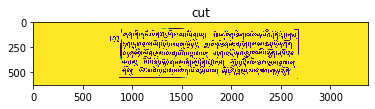

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00017-2.jpg !!!
[0, 1890.3333333333333, 3379, 2520.6666666666665]


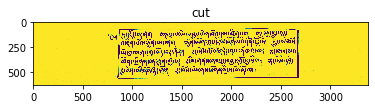

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00017-3.jpg !!!
image00018.jpg
(3375, 2601)
Processing image00018


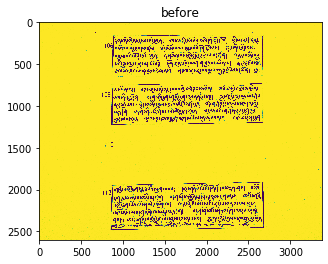

{4: 4, 3: 8, 2: 55, 1: 19}
threshold 2
[0, 152, 3375, 658]
[0, 725, 3375, 1231]
[0, 1904, 3375, 2487]
[0, 152, 3375, 702.6666666666666]


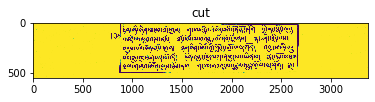

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00018-0.jpg !!!
[0, 680.3333333333334, 3375, 1275.6666666666667]


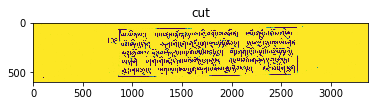

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00018-1.jpg !!!
[0, 1859.3333333333333, 3375, 2531.6666666666665]


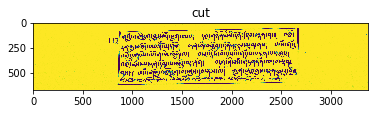

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00018-2.jpg !!!
image00019.jpg
(3395, 2600)
Processing image00019


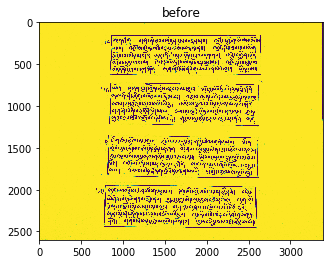

{3: 8, 2: 24, 4: 11, 1: 7}
threshold 2
[0, 150, 3395, 643]
[0, 719, 3395, 1244]
[0, 1346, 3395, 1867]
[0, 1937, 3395, 2462]
[0, 150, 3395, 698.1111111111111]


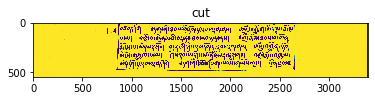

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00019-0.jpg !!!
[0, 663.8888888888889, 3395, 1299.111111111111]


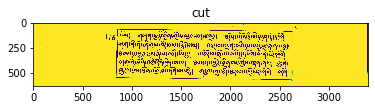

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00019-1.jpg !!!
[0, 1290.888888888889, 3395, 1922.111111111111]


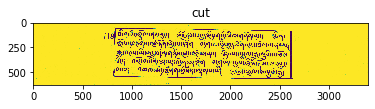

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00019-2.jpg !!!
[0, 1881.888888888889, 3395, 2517.1111111111113]


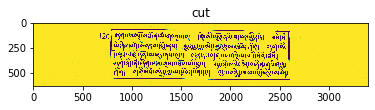

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00019-3.jpg !!!
image00020.jpg
(3371, 2599)
Processing image00020


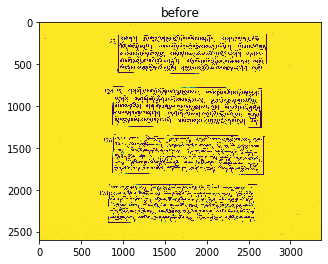

{4: 14, 2: 14, 1: 29, 3: 14}
threshold 2
[0, 130, 3371, 630]
[0, 761, 3371, 1266]
[0, 1335, 3371, 1828]
[0, 1923, 3371, 2409]
[0, 130, 3371, 695.5555555555555]


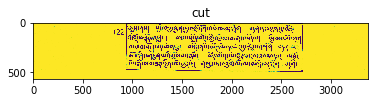

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00020-0.jpg !!!
[0, 695.4444444444445, 3371, 1331.5555555555557]


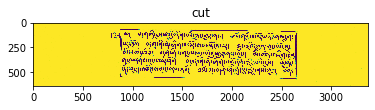

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00020-1.jpg !!!
[0, 1269.4444444444443, 3371, 1893.5555555555557]


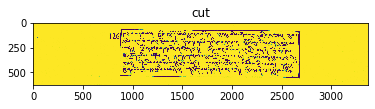

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00020-2.jpg !!!
[0, 1857.4444444444443, 3371, 2474.5555555555557]


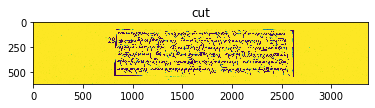

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00020-3.jpg !!!
image00021.jpg
(3373, 2597)
Processing image00021


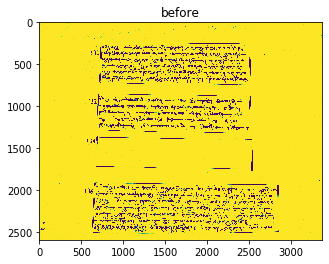

{3: 41, 1: 328, 2: 9, 4: 25}
threshold 2
[0, 242, 3373, 753]
[0, 848, 3373, 1329]
[0, 1906, 3373, 2528]
[0, 242, 3373, 816.3333333333334]


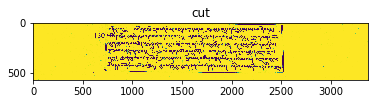

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00021-0.jpg !!!
[0, 784.6666666666666, 3373, 1392.3333333333333]


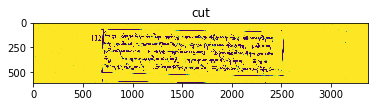

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00021-1.jpg !!!
[0, 1842.6666666666667, 3373, 2591.3333333333335]


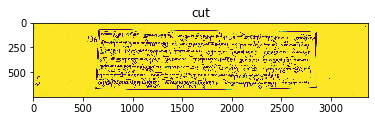

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00021-2.jpg !!!
image00022.jpg
(3393, 2603)
Processing image00022


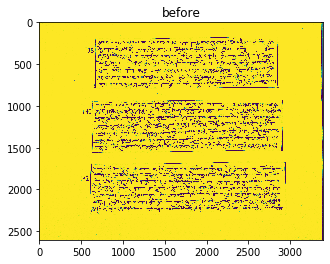

{4: 5, 1: 20, 2: 10, 3: 11}
threshold 2
[0, 169, 3393, 802]
[0, 920, 3393, 1566]
[0, 1660, 3393, 2305]
[0, 169, 3393, 872.6666666666666]


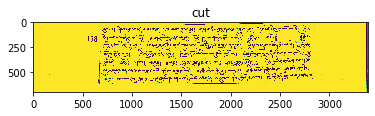

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00022-0.jpg !!!
[0, 849.3333333333334, 3393, 1636.6666666666667]


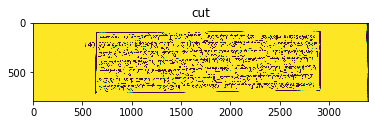

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00022-1.jpg !!!
[0, 1589.3333333333333, 3393, 2375.6666666666665]


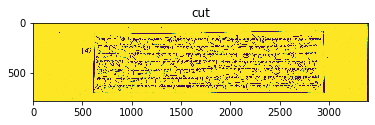

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00022-2.jpg !!!
image00023.jpg
(3363, 2597)
Processing image00023


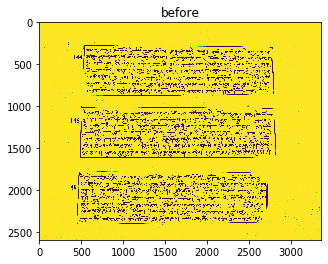

{1: 36, 2: 4, 3: 7, 4: 5}
threshold 2
[0, 268, 3363, 887]
[0, 1008, 3363, 1627]
[0, 1772, 3363, 2416]
[0, 268, 3363, 975.6666666666666]


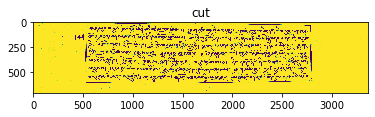

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00023-0.jpg !!!
[0, 919.3333333333334, 3363, 1715.6666666666667]


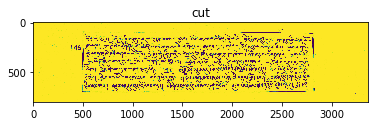

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00023-1.jpg !!!
[0, 1683.3333333333333, 3363, 2504.6666666666665]


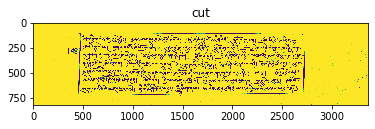

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00023-2.jpg !!!
image00024.jpg
(3388, 2595)
Processing image00024


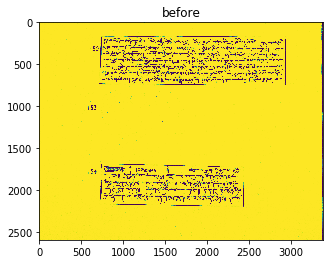

{2: 37, 3: 14, 4: 10, 1: 7}
threshold 2
[0, 160, 3388, 760]
[0, 1682, 3388, 2203]
[0, 160, 3388, 826.6666666666666]


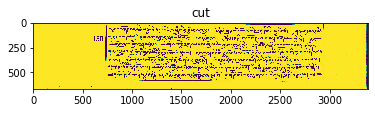

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00024-0.jpg !!!
[0, 1615.3333333333333, 3388, 2269.6666666666665]


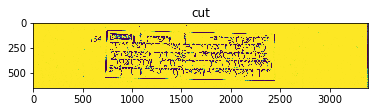

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00024-1.jpg !!!
image00024 Failed
image00025.jpg
(3366, 2595)
Processing image00025


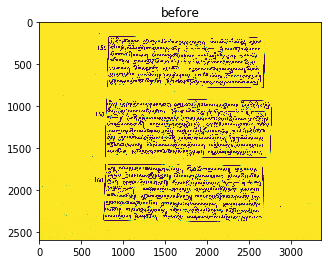

{4: 4, 3: 8, 2: 10, 1: 11}
threshold 2
[0, 164, 3366, 792]
[0, 905, 3366, 1625]
[0, 1684, 3366, 2391]
[0, 164, 3366, 849.3333333333334]


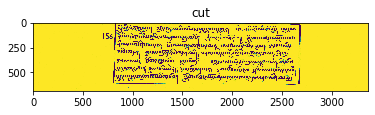

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00025-0.jpg !!!
[0, 847.6666666666666, 3366, 1682.3333333333333]


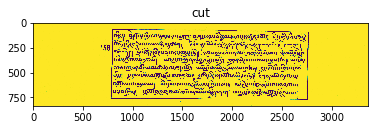

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00025-1.jpg !!!
[0, 1626.6666666666667, 3366, 2448.3333333333335]


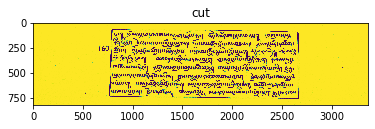

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00025-2.jpg !!!
image00026.jpg
(3368, 2595)
Processing image00026


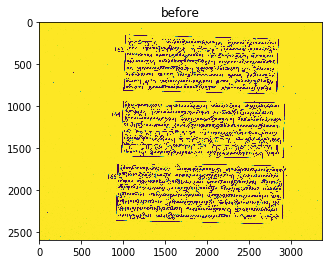

{1: 6, 3: 5, 4: 1, 2: 1}
threshold 2
[0, 149, 3368, 864]
[0, 932, 3368, 1628]
[0, 1677, 3368, 2413]
[0, 149, 3368, 903.0]


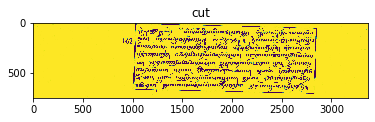

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00026-0.jpg !!!
[0, 893.0, 3368, 1667.0]


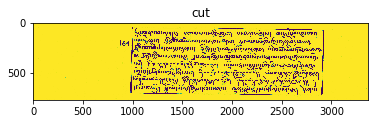

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00026-1.jpg !!!
[0, 1638.0, 3368, 2452.0]


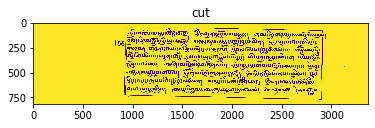

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00026-2.jpg !!!
image00027.jpg
(3388, 2592)
Processing image00027


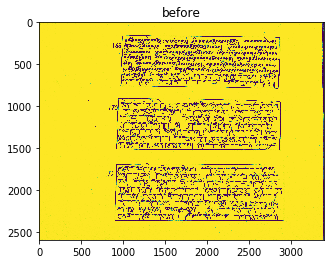

{3: 7, 1: 11, 2: 5, 4: 3}
threshold 2
[0, 149, 3388, 796]
[0, 899, 3388, 1530]
[0, 1680, 3388, 2373]
[0, 149, 3388, 864.6666666666666]


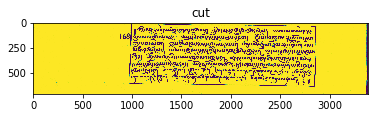

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00027-0.jpg !!!
[0, 830.3333333333334, 3388, 1598.6666666666667]


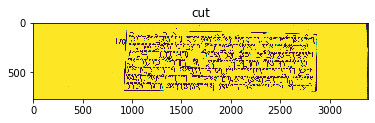

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00027-1.jpg !!!
[0, 1611.3333333333333, 3388, 2441.6666666666665]


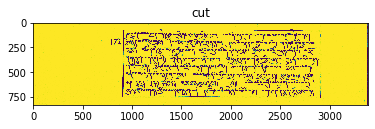

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00027-2.jpg !!!
image00028.jpg
(3368, 2596)
Processing image00028


/usr/local/lib/python3.6/dist-packages/scipy/cluster/vq.py:139: RuntimeWarning: Some columns have standard deviation zero. The values of these columns will not change.
  RuntimeWarning)


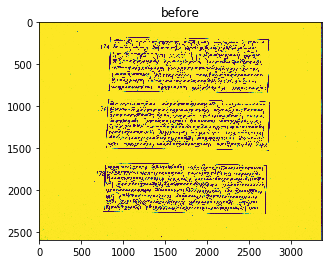

{1: 8, 4: 14, 2: 2, 3: 5}
threshold 2
[0, 171, 3368, 851]
[0, 915, 3368, 1536]
[0, 1672, 3368, 2295]
[0, 171, 3368, 917.6666666666666]


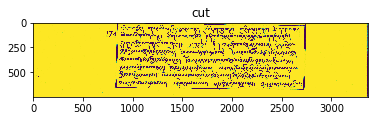

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00028-0.jpg !!!
[0, 848.3333333333334, 3368, 1602.6666666666667]


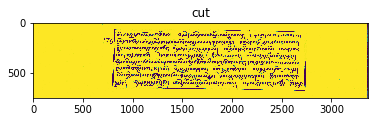

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00028-1.jpg !!!
[0, 1605.3333333333333, 3368, 2361.6666666666665]


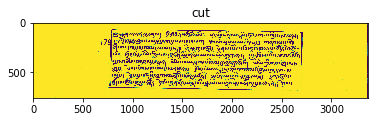

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00028-2.jpg !!!
image00029.jpg
(3398, 2589)
Processing image00029


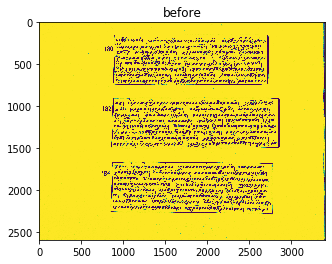

{2: 11, 1: 29, 3: 10, 4: 15}
threshold 2
[0, 174, 3398, 757]
[0, 894, 3398, 1509]
[0, 1655, 3398, 2283]
[0, 174, 3398, 851.3333333333334]


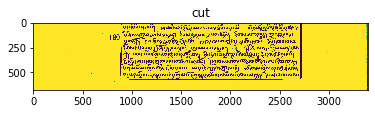

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00029-0.jpg !!!
[0, 799.6666666666666, 3398, 1603.3333333333333]


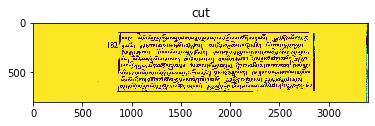

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00029-1.jpg !!!
[0, 1560.6666666666667, 3398, 2377.3333333333335]


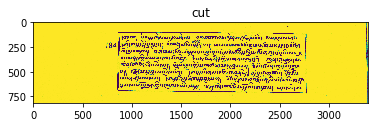

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00029-2.jpg !!!
image00030.jpg
(3410, 2592)
Processing image00030


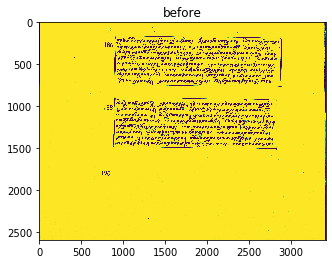

{2: 20, 4: 15, 3: 27, 1: 11}
threshold 2
[0, 158, 3410, 775]
[0, 892, 3410, 1513]
[0, 158, 3410, 853.0]


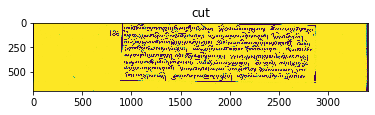

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00030-0.jpg !!!
[0, 814.0, 3410, 1591.0]


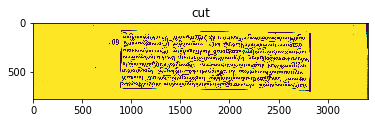

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00030-1.jpg !!!
image00030 Failed
image00031.jpg
(3449, 2609)
Processing image00031


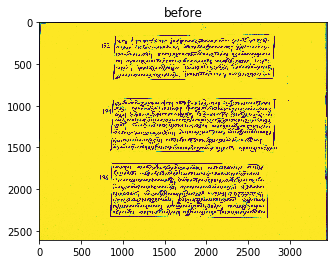

{4: 22, 1: 20, 2: 9, 3: 19}
threshold 2
[0, 141, 3449, 704]
[0, 901, 3449, 1568]
[0, 1681, 3449, 2353]
[0, 141, 3449, 779.3333333333334]


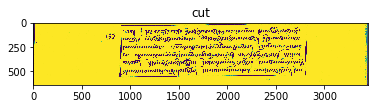

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00031-0.jpg !!!
[0, 825.6666666666666, 3449, 1643.3333333333333]


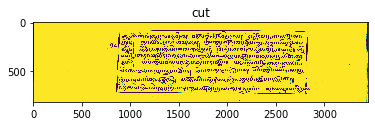

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00031-1.jpg !!!
[0, 1605.6666666666667, 3449, 2428.3333333333335]


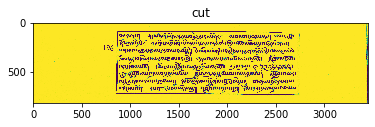

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00031-2.jpg !!!
image00032.jpg
(3452, 2593)
Processing image00032


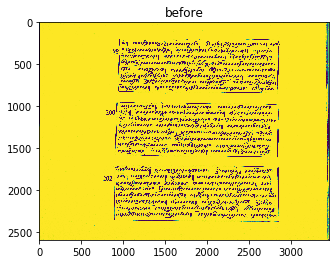

{1: 21, 4: 29, 2: 6, 3: 8}
threshold 2
[0, 194, 3452, 851]
[0, 947, 3452, 1612]
[0, 1699, 3452, 2381]
[0, 194, 3452, 912.0]


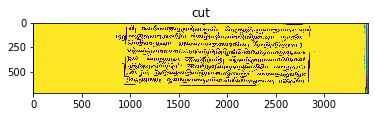

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00032-0.jpg !!!
[0, 886.0, 3452, 1673.0]


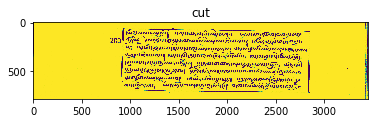

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00032-1.jpg !!!
[0, 1638.0, 3452, 2442.0]


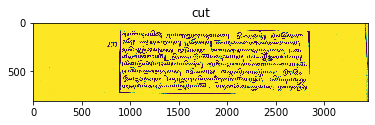

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00032-2.jpg !!!
image00033.jpg
(3493, 2587)
Processing image00033


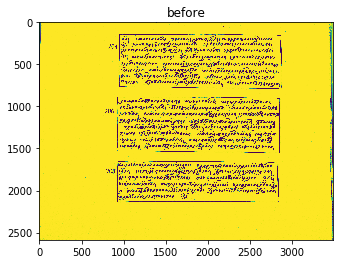

{1: 21, 4: 13, 3: 16, 2: 12}
threshold 2
[0, 137, 3493, 799]
[0, 882, 3493, 1562]
[0, 1643, 3493, 2144]
[0, 137, 3493, 853.6666666666666]


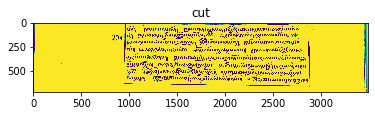

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00033-0.jpg !!!
[0, 827.3333333333334, 3493, 1616.6666666666667]


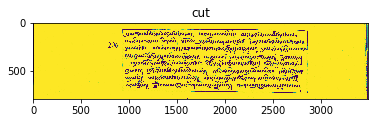

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00033-1.jpg !!!
[0, 1588.3333333333333, 3493, 2198.6666666666665]


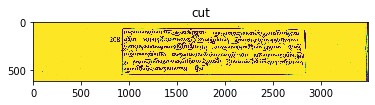

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00033-2.jpg !!!
image00034.jpg
(3500, 2602)
Processing image00034


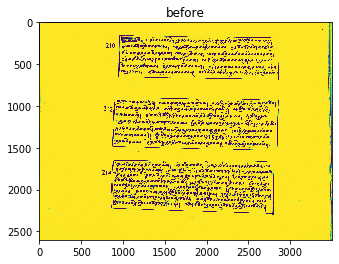

{2: 5, 4: 6, 3: 10, 1: 14}
threshold 2
[0, 154, 3500, 692]
[0, 897, 3500, 1537]
[0, 1644, 3500, 2294]
[0, 154, 3500, 763.3333333333334]


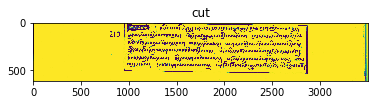

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00034-0.jpg !!!
[0, 825.6666666666666, 3500, 1608.3333333333333]


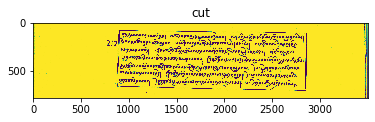

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00034-1.jpg !!!
[0, 1572.6666666666667, 3500, 2365.3333333333335]


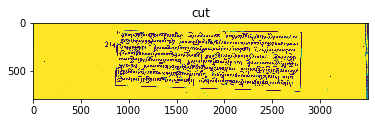

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00034-2.jpg !!!
image00035.jpg
(3501, 2589)
Processing image00035


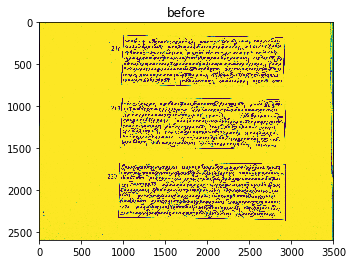

{4: 2, 3: 6, 2: 6, 1: 13}
threshold 2
[0, 150, 3501, 772]
[0, 894, 3501, 1519]
[0, 1663, 3501, 2357]
[0, 150, 3501, 860.6666666666666]


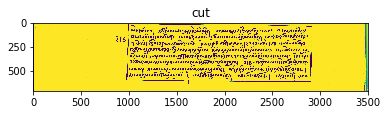

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00035-0.jpg !!!
[0, 805.3333333333334, 3501, 1607.6666666666667]


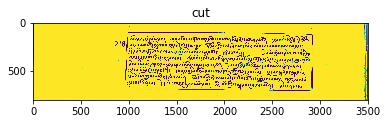

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00035-1.jpg !!!
[0, 1574.3333333333333, 3501, 2445.6666666666665]


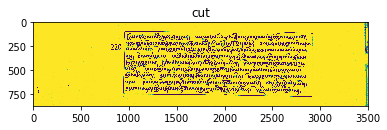

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00035-2.jpg !!!
image00036.jpg
(3461, 2615)
Processing image00036


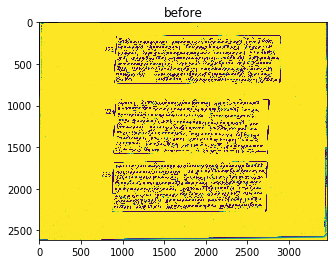

{1: 8, 2: 14, 3: 12, 4: 13}
threshold 2
[0, 149, 3461, 754]
[0, 910, 3461, 1593]
[0, 1659, 3461, 2287]
[0, 149, 3461, 798.0]


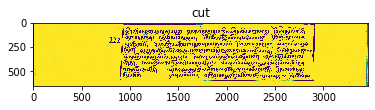

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00036-0.jpg !!!
[0, 866.0, 3461, 1637.0]


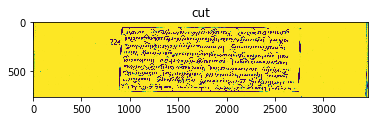

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00036-1.jpg !!!
[0, 1615.0, 3461, 2331.0]


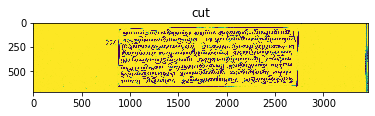

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00036-2.jpg !!!
image00037.jpg
(3505, 2605)
Processing image00037


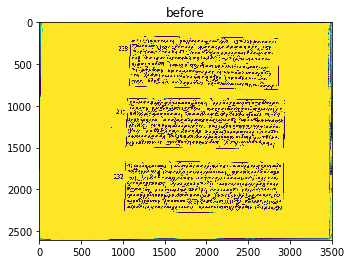

{2: 19, 3: 8, 1: 5, 4: 5}
threshold 2
[0, 161, 3505, 815]
[0, 902, 3505, 1530]
[0, 1651, 3505, 2294]
[0, 161, 3505, 884.3333333333334]


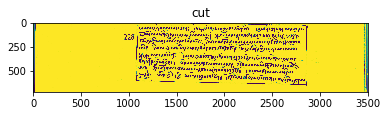

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00037-0.jpg !!!
[0, 832.6666666666666, 3505, 1599.3333333333333]


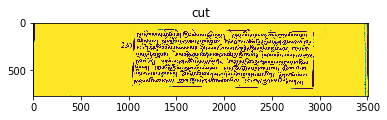

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00037-1.jpg !!!
[0, 1581.6666666666667, 3505, 2363.3333333333335]


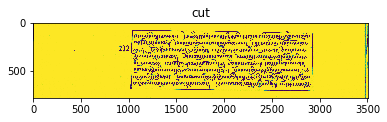

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00037-2.jpg !!!
image00038.jpg
(3462, 2605)
Processing image00038


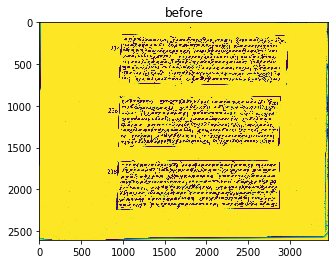

{4: 24, 1: 5, 2: 4, 3: 7}
threshold 2
[0, 141, 3462, 762]
[0, 876, 3462, 1501]
[0, 1644, 3462, 2250]
[0, 141, 3462, 847.6666666666666]


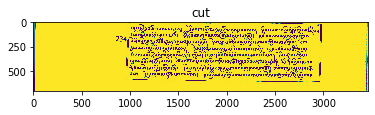

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00038-0.jpg !!!
[0, 790.3333333333334, 3462, 1586.6666666666667]


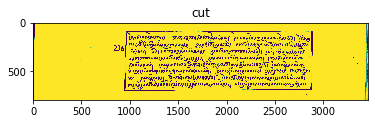

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00038-1.jpg !!!
[0, 1558.3333333333333, 3462, 2335.6666666666665]


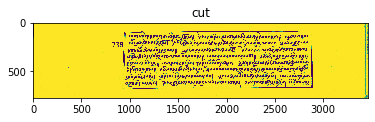

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00038-2.jpg !!!
image00039.jpg
(3361, 2618)
Processing image00039


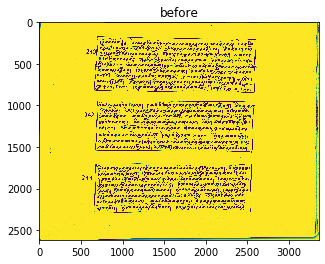

{3: 1, 4: 8, 2: 4, 1: 3}
threshold 2
[0, 168, 3361, 855]
[0, 938, 3361, 1565]
[0, 1691, 3361, 2303]
[0, 168, 3361, 924.6666666666666]


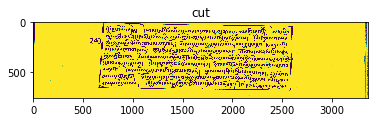

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00039-0.jpg !!!
[0, 868.3333333333334, 3361, 1634.6666666666667]


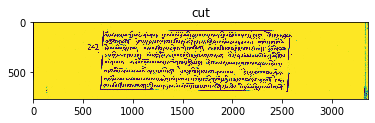

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00039-1.jpg !!!
[0, 1621.3333333333333, 3361, 2372.6666666666665]


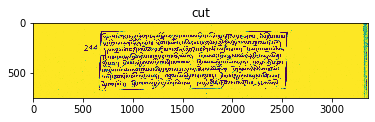

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00039-2.jpg !!!
image00040.jpg
(3409, 2585)
Processing image00040


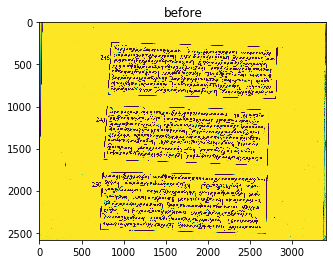

{4: 5, 3: 5, 1: 2, 2: 7}
threshold 2
[0, 236, 3409, 916]
[0, 987, 3409, 1706]
[0, 1773, 3409, 2515]
[0, 236, 3409, 962.0]


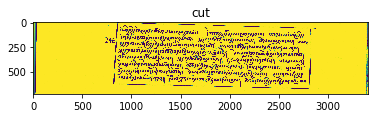

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00040-0.jpg !!!
[0, 941.0, 3409, 1752.0]


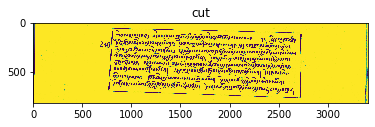

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00040-1.jpg !!!
[0, 1727.0, 3409, 2561.0]


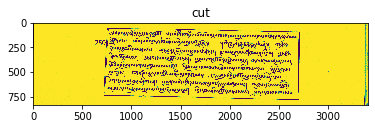

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00040-2.jpg !!!
image00041.jpg
(3421, 2590)
Processing image00041


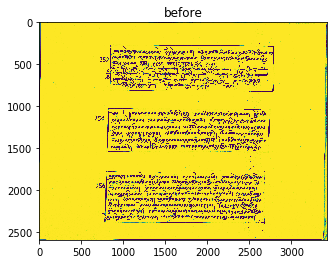

{3: 18, 4: 32, 1: 27, 2: 23}
threshold 2
[0, 263, 3421, 836]
[0, 1018, 3421, 1554]
[0, 1758, 3421, 2397]
[0, 263, 3421, 902.6666666666666]


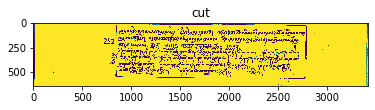

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00041-0.jpg !!!
[0, 951.3333333333334, 3421, 1620.6666666666667]


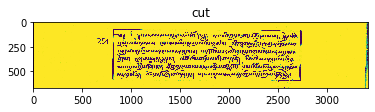

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00041-1.jpg !!!
[0, 1691.3333333333333, 3421, 2463.6666666666665]


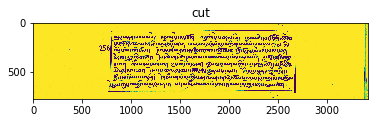

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00041-2.jpg !!!
image00042.jpg
(3455, 2605)
Processing image00042


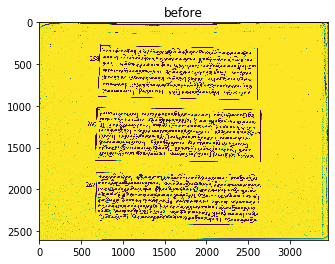

{1: 128, 3: 74, 2: 164, 4: 24}
threshold 2
[0, 271, 3455, 941]
[0, 1014, 3455, 1684]
[0, 1780, 3455, 2436]
[0, 2443, 3455, 2568]
[0, 271, 3455, 980.1111111111111]


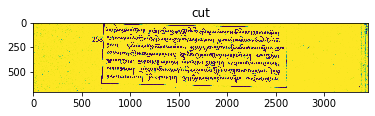

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00042-0.jpg !!!
[0, 974.8888888888889, 3455, 1723.111111111111]


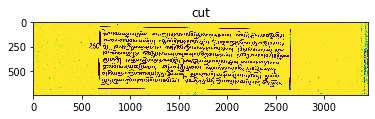

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00042-1.jpg !!!
[0, 1740.888888888889, 3455, 2475.1111111111113]


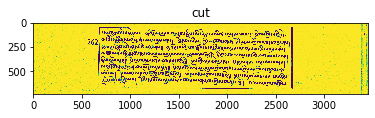

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00042-2.jpg !!!
[0, 2403.8888888888887, 3455, 2604.0]


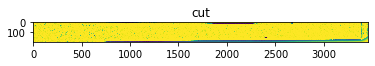

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00042-3.jpg !!!
image00043.jpg
(3478, 2610)
Processing image00043


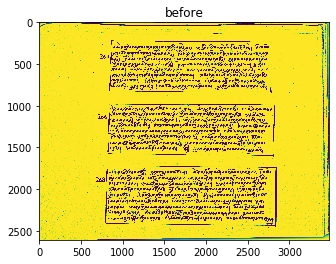

{3: 34, 1: 131, 2: 131, 4: 30}
threshold 2
[0, 215, 3478, 850]
[0, 975, 3478, 1608]
[0, 1714, 3478, 2598]
[0, 215, 3478, 927.0]


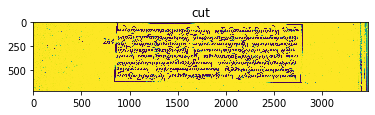

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00043-0.jpg !!!
[0, 898.0, 3478, 1685.0]


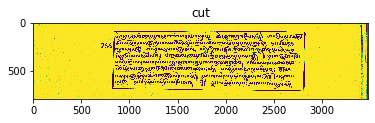

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00043-1.jpg !!!
[0, 1637.0, 3478, 2609.0]


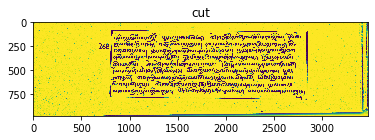

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00043-2.jpg !!!
image00044.jpg
(3437, 2587)
Processing image00044


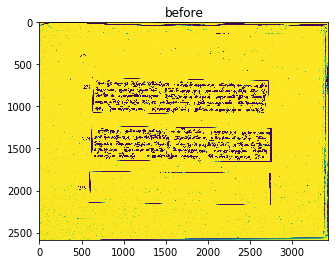

{3: 146, 4: 16, 1: 225, 2: 505}
threshold 2
[0, 653, 3437, 1105]
[0, 1226, 3437, 1667]
[0, 1762, 3437, 2180]
[0, 2297, 3437, 2537]
[0, 653, 3437, 1179.0]


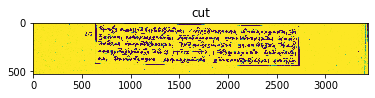

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00044-0.jpg !!!
[0, 1152.0, 3437, 1741.0]


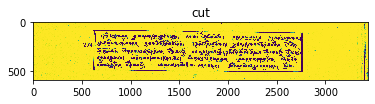

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00044-1.jpg !!!
[0, 1688.0, 3437, 2254.0]


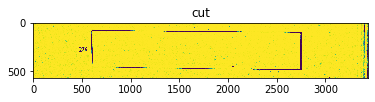

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00044-2.jpg !!!
[0, 2223.0, 3437, 2586.0]


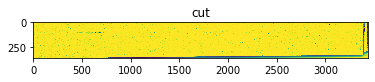

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00044-3.jpg !!!
image00045.jpg
(3462, 2578)
Processing image00045


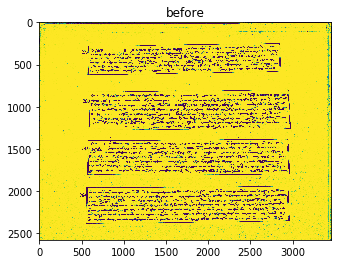

{4: 31, 3: 124, 2: 193, 1: 116}
threshold 2
[0, 246, 3462, 632]
[0, 794, 3462, 1281]
[0, 1378, 3462, 1819]
[0, 1931, 3462, 2566]
[0, 246, 3462, 701.6666666666666]


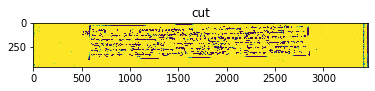

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00045-0.jpg !!!
[0, 724.3333333333334, 3462, 1350.6666666666667]


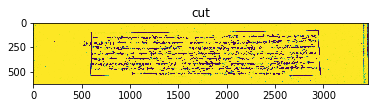

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00045-1.jpg !!!
[0, 1308.3333333333333, 3462, 1888.6666666666667]


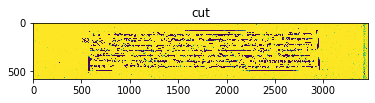

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00045-2.jpg !!!
[0, 1861.3333333333333, 3462, 2577.0]


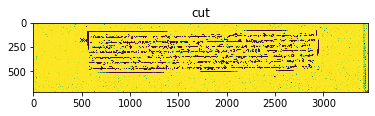

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00045-3.jpg !!!
image00046.jpg
(3459, 2595)
Processing image00046


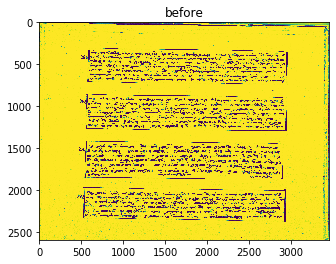

{3: 18, 1: 150, 2: 137, 4: 13}
threshold 2
[0, 301, 3459, 748]
[0, 853, 3459, 1302]
[0, 1411, 3459, 1882]
[0, 1960, 3459, 2382]
[0, 301, 3459, 812.8888888888889]


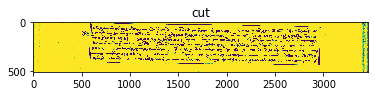

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00046-0.jpg !!!
[0, 788.1111111111111, 3459, 1366.888888888889]


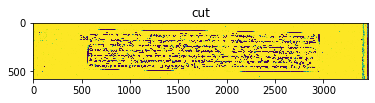

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00046-1.jpg !!!
[0, 1346.111111111111, 3459, 1946.888888888889]


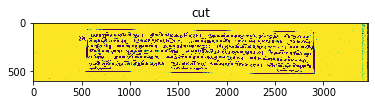

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00046-2.jpg !!!
[0, 1895.111111111111, 3459, 2446.8888888888887]


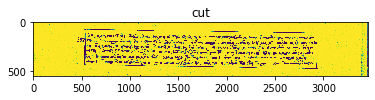

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00046-3.jpg !!!
image00047.jpg
(3471, 2706)
Processing image00047


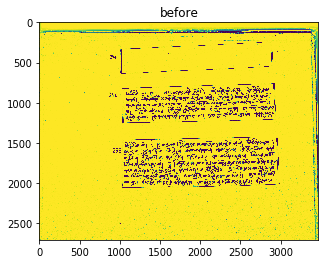

{1: 618, 2: 186, 3: 31, 4: 51}
threshold 2
[0, 221, 3471, 346]
[0, 758, 3471, 1259]
[0, 1419, 3471, 2064]
[0, 112.66666666666669, 3471, 412.6666666666667]


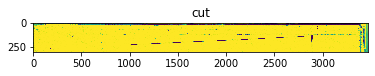

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00047-0.jpg !!!
[0, 691.3333333333334, 3471, 1325.6666666666667]


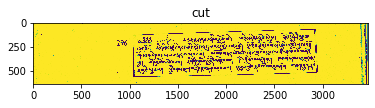

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00047-1.jpg !!!
[0, 1352.3333333333333, 3471, 2130.6666666666665]


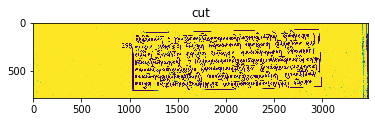

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00047-2.jpg !!!
image00048.jpg
(3469, 2707)
Processing image00048


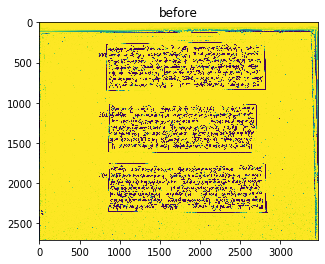

{1: 340, 2: 50, 3: 30, 4: 24}
threshold 2
[0, 238, 3469, 859]
[0, 1009, 3469, 1593]
[0, 1748, 3469, 2379]
[0, 238, 3469, 925.6666666666666]


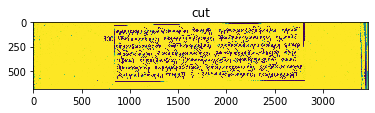

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00048-0.jpg !!!
[0, 942.3333333333334, 3469, 1659.6666666666667]


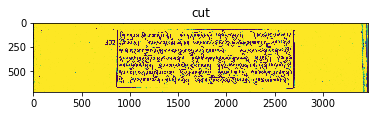

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00048-1.jpg !!!
[0, 1681.3333333333333, 3469, 2445.6666666666665]


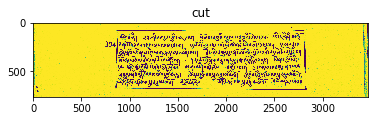

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00048-2.jpg !!!
image00049.jpg
(3465, 2582)
Processing image00049


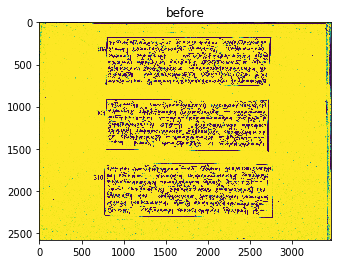

{4: 22, 2: 119, 1: 217, 3: 20}
threshold 2
[0, 171, 3465, 765]
[0, 907, 3465, 1536]
[0, 1666, 3465, 2326]
[0, 171, 3465, 855.6666666666666]


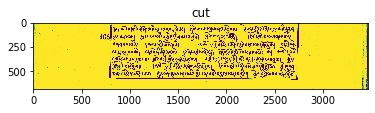

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00049-0.jpg !!!
[0, 816.3333333333334, 3465, 1626.6666666666667]


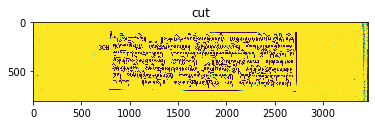

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00049-1.jpg !!!
[0, 1575.3333333333333, 3465, 2416.6666666666665]


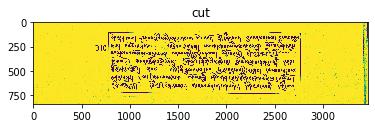

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00049-2.jpg !!!
image00050.jpg
(3465, 2588)
Processing image00050


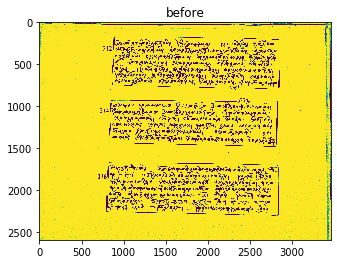

{4: 10, 1: 292, 2: 40, 3: 21}
threshold 2
[0, 169, 3465, 804]
[0, 905, 3465, 1488]
[0, 1660, 3465, 2305]
[0, 169, 3465, 871.3333333333334]


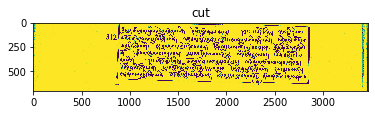

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00050-0.jpg !!!
[0, 837.6666666666666, 3465, 1555.3333333333333]


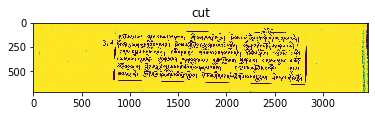

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00050-1.jpg !!!
[0, 1592.6666666666667, 3465, 2372.3333333333335]


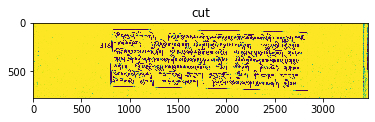

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00050-2.jpg !!!
image00051.jpg
(3467, 2585)
Processing image00051


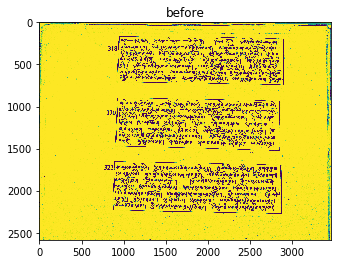

{2: 174, 1: 191, 3: 23, 4: 12}
threshold 2
[0, 162, 3467, 753]
[0, 892, 3467, 1533]
[0, 1646, 3467, 2281]
[0, 162, 3467, 837.0]


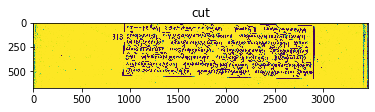

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00051-0.jpg !!!
[0, 808.0, 3467, 1617.0]


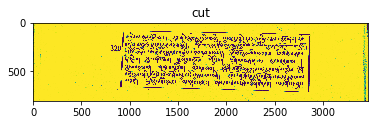

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00051-1.jpg !!!
[0, 1562.0, 3467, 2365.0]


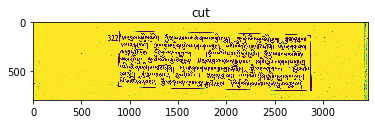

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00051-2.jpg !!!
image00052.jpg
(3469, 2571)
Processing image00052


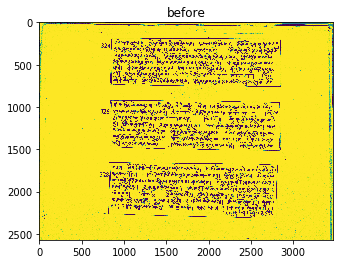

{3: 12, 4: 8, 2: 33, 1: 267}
threshold 2
[0, 181, 3469, 771]
[0, 914, 3469, 1523]
[0, 1647, 3469, 2323]
[0, 181, 3469, 860.0]


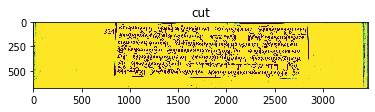

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00052-0.jpg !!!
[0, 825.0, 3469, 1612.0]


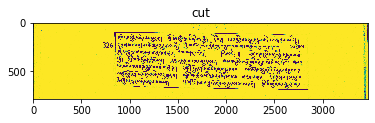

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00052-1.jpg !!!
[0, 1558.0, 3469, 2412.0]


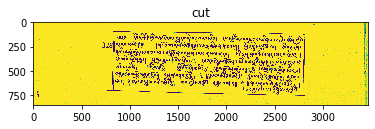

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00052-2.jpg !!!
image00053.jpg
(3435, 2587)
Processing image00053


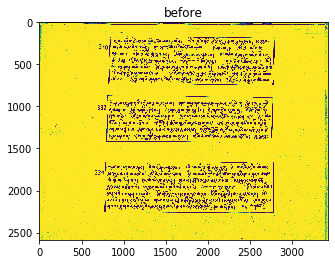

{1: 167, 2: 213, 3: 41, 4: 18}
threshold 2
[0, 168, 3435, 756]
[0, 912, 3435, 1436]
[0, 1648, 3435, 2274]
[0, 2450, 3435, 2575]
[0, 168, 3435, 822.6666666666666]


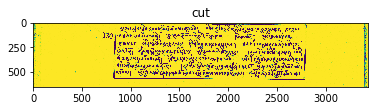

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00053-0.jpg !!!
[0, 845.3333333333334, 3435, 1502.6666666666667]


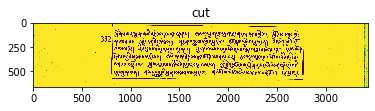

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00053-1.jpg !!!
[0, 1581.3333333333333, 3435, 2340.6666666666665]


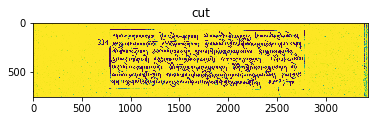

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00053-2.jpg !!!
[0, 2383.3333333333335, 3435, 2586.0]


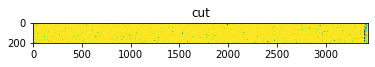

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00053-3.jpg !!!
image00054.jpg
(3474, 2577)
Processing image00054


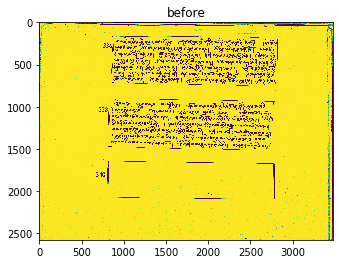

{4: 30, 2: 93, 1: 708, 3: 18}
threshold 2
[0, 159, 3474, 766]
[0, 900, 3474, 1522]
[0, 159, 3474, 855.3333333333334]


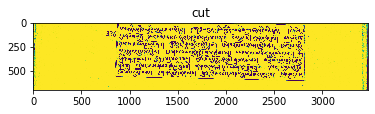

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00054-0.jpg !!!
[0, 810.6666666666666, 3474, 1611.3333333333333]


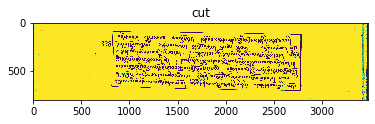

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00054-1.jpg !!!
image00054 Failed
image00055.jpg
(3461, 2569)
Processing image00055


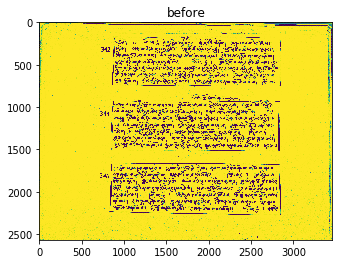

{4: 25, 2: 116, 3: 34, 1: 229}
threshold 2
[0, 166, 3461, 767]
[0, 852, 3461, 1529]
[0, 1657, 3461, 2285]
[0, 166, 3461, 838.0]


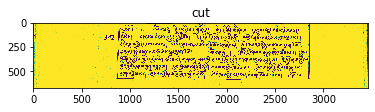

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00055-0.jpg !!!
[0, 781.0, 3461, 1600.0]


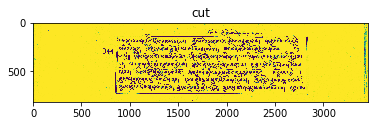

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00055-1.jpg !!!
[0, 1586.0, 3461, 2356.0]


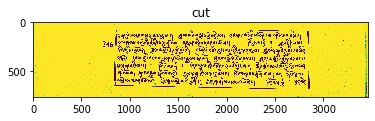

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00055-2.jpg !!!
image00056.jpg
(3479, 2589)
Processing image00056


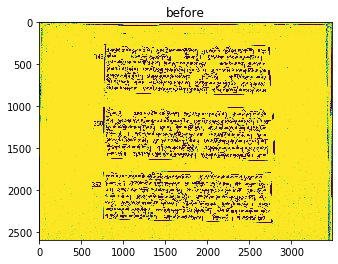

{2: 70, 3: 24, 1: 169, 4: 11}
threshold 2
[0, 260, 3479, 875]
[0, 996, 3479, 1653]
[0, 1760, 3479, 2390]
[0, 260, 3479, 951.0]


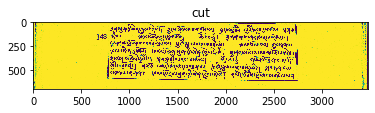

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00056-0.jpg !!!
[0, 920.0, 3479, 1729.0]


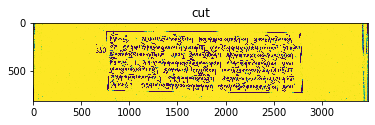

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00056-1.jpg !!!
[0, 1684.0, 3479, 2466.0]


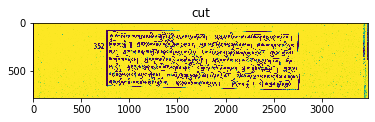

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00056-2.jpg !!!
image00057.jpg
(3479, 2588)
Processing image00057


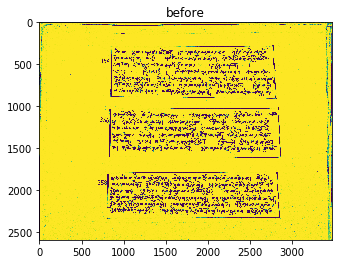

{1: 301, 2: 86, 3: 41, 4: 18}
threshold 2
[0, 276, 3479, 916]
[0, 1013, 3479, 1555]
[0, 1771, 3479, 2340]
[0, 276, 3479, 980.6666666666666]


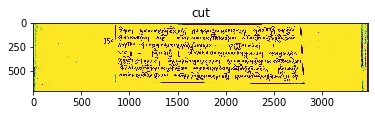

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00057-0.jpg !!!
[0, 948.3333333333334, 3479, 1619.6666666666667]


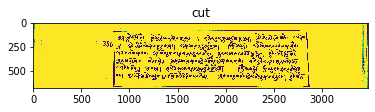

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00057-1.jpg !!!
[0, 1706.3333333333333, 3479, 2404.6666666666665]


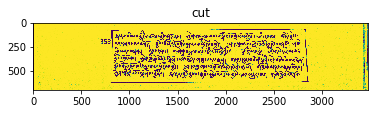

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00057-2.jpg !!!
image00058.jpg
(3437, 2576)
Processing image00058


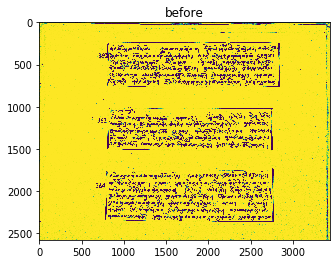

{4: 21, 1: 230, 2: 107, 3: 22}
threshold 2
[0, 232, 3437, 780]
[0, 1008, 3437, 1523]
[0, 1745, 3437, 2370]
[0, 232, 3437, 846.6666666666666]


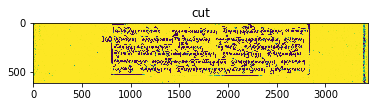

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00058-0.jpg !!!
[0, 941.3333333333334, 3437, 1589.6666666666667]


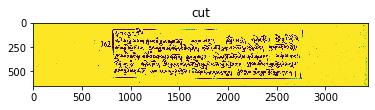

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00058-1.jpg !!!
[0, 1678.3333333333333, 3437, 2436.6666666666665]


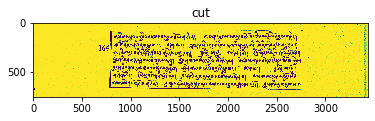

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00058-2.jpg !!!
image00059.jpg
(3413, 2787)
Processing image00059


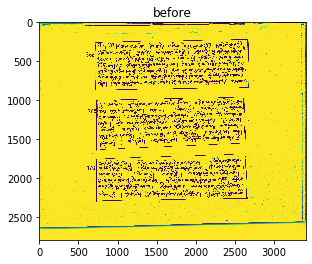

{3: 18, 2: 68, 4: 18, 1: 278}
threshold 2
[0, 214, 3413, 877]
[0, 953, 3413, 1641]
[0, 1677, 3413, 2313]
[0, 214, 3413, 914.3333333333334]


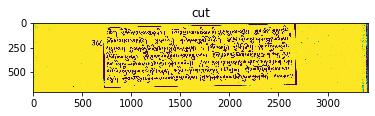

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00059-0.jpg !!!
[0, 915.6666666666666, 3413, 1678.3333333333333]


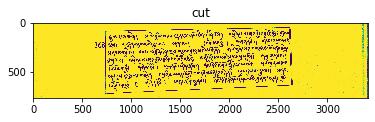

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00059-1.jpg !!!
[0, 1639.6666666666667, 3413, 2350.3333333333335]


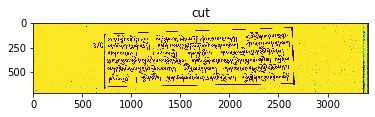

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00059-2.jpg !!!
image00060.jpg
(3446, 2577)
Processing image00060


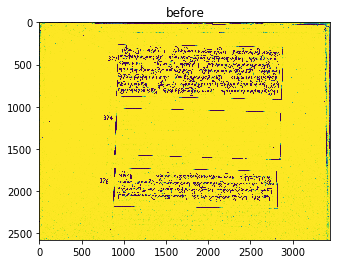

{3: 37, 1: 680, 4: 46, 2: 217}
threshold 2
[0, 258, 3446, 924]
[0, 1717, 3446, 2213]
[0, 258, 3446, 990.6666666666666]


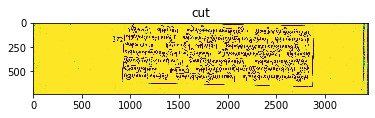

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00060-0.jpg !!!
[0, 1650.3333333333333, 3446, 2279.6666666666665]


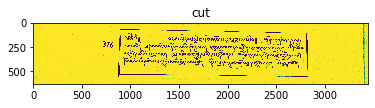

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00060-1.jpg !!!
image00060 Failed
image00061.jpg
(3444, 2573)
Processing image00061


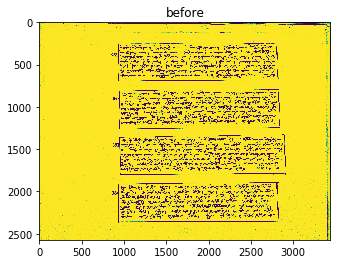

{2: 115, 4: 20, 3: 28, 1: 206}
threshold 2
[0, 244, 3444, 670]
[0, 787, 3444, 1223]
[0, 1322, 3444, 1811]
[0, 1885, 3444, 2369]
[0, 244, 3444, 734.4444444444445]


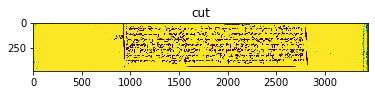

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00061-0.jpg !!!
[0, 722.5555555555555, 3444, 1287.4444444444443]


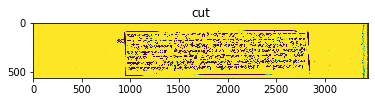

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00061-1.jpg !!!
[0, 1257.5555555555557, 3444, 1875.4444444444443]


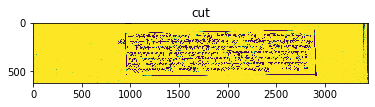

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00061-2.jpg !!!
[0, 1820.5555555555557, 3444, 2433.4444444444443]


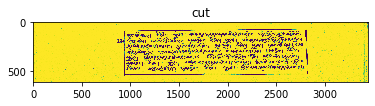

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00061-3.jpg !!!
image00062.jpg
(3462, 2560)
Processing image00062


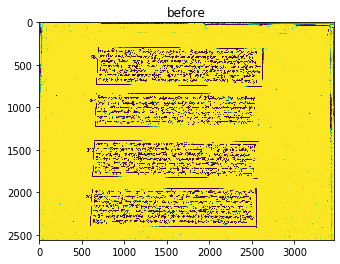

{3: 32, 4: 14, 1: 226, 2: 44}
threshold 2
[0, 287, 3462, 766]
[0, 826, 3462, 1213]
[0, 1381, 3462, 1845]
[0, 1937, 3462, 2413]
[0, 287, 3462, 816.6666666666666]


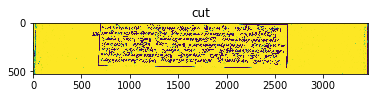

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00062-0.jpg !!!
[0, 775.3333333333334, 3462, 1263.6666666666667]


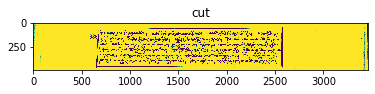

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00062-1.jpg !!!
[0, 1330.3333333333333, 3462, 1895.6666666666667]


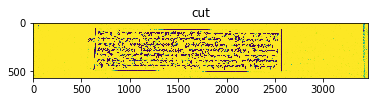

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00062-2.jpg !!!
[0, 1886.3333333333333, 3462, 2463.6666666666665]


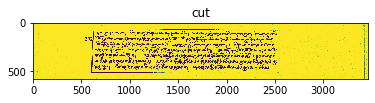

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00062-3.jpg !!!
image00063.jpg
(3458, 2562)
Processing image00063


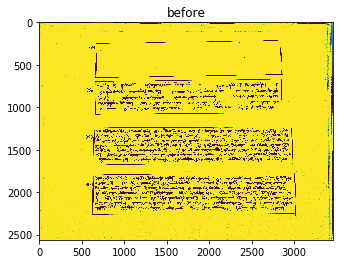

{3: 38, 2: 118, 4: 36, 1: 594}
threshold 2
[0, 605, 3458, 1095]
[0, 1224, 3458, 1689]
[0, 1775, 3458, 2273]
[0, 605, 3458, 1166.6666666666667]


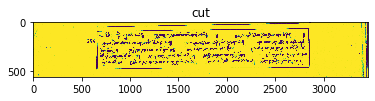

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00063-0.jpg !!!
[0, 1152.3333333333333, 3458, 1760.6666666666667]


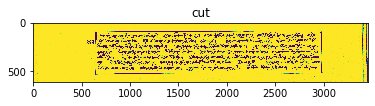

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00063-1.jpg !!!
[0, 1703.3333333333333, 3458, 2344.6666666666665]


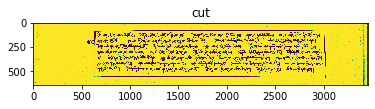

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00063-2.jpg !!!
image00064.jpg
(3461, 2568)
Processing image00064


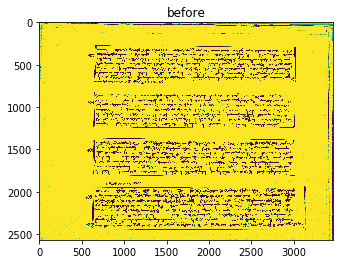

{3: 44, 4: 22, 2: 80, 1: 120}
threshold 2
[0, 268, 3461, 729]
[0, 812, 3461, 1257]
[0, 1361, 3461, 1825]
[0, 1880, 3461, 2460]
[0, 268, 3461, 782.7777777777778]


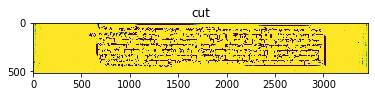

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00064-0.jpg !!!
[0, 758.2222222222222, 3461, 1310.7777777777778]


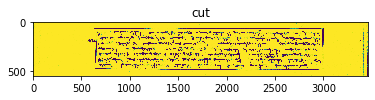

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00064-1.jpg !!!
[0, 1307.2222222222222, 3461, 1878.7777777777778]


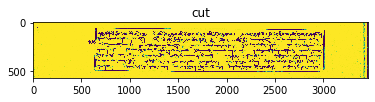

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00064-2.jpg !!!
[0, 1826.2222222222222, 3461, 2513.777777777778]


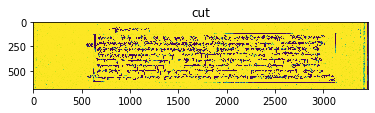

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00064-3.jpg !!!
image00065.jpg
(3447, 2574)
Processing image00065


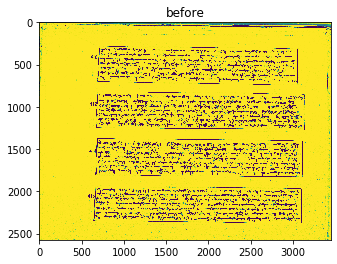

{4: 12, 2: 95, 3: 22, 1: 158}
threshold 2
[0, 278, 3447, 751]
[0, 816, 3447, 1275]
[0, 1367, 3447, 1836]
[0, 1937, 3447, 2383]
[0, 278, 3447, 808.3333333333334]


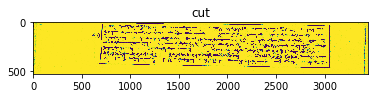

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00065-0.jpg !!!
[0, 758.6666666666666, 3447, 1332.3333333333333]


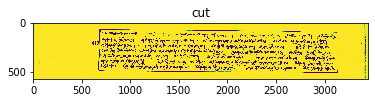

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00065-1.jpg !!!
[0, 1309.6666666666667, 3447, 1893.3333333333333]


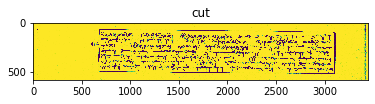

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00065-2.jpg !!!
[0, 1879.6666666666667, 3447, 2440.3333333333335]


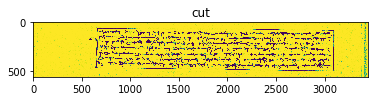

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00065-3.jpg !!!
image00066.jpg
(3451, 2563)
Processing image00066


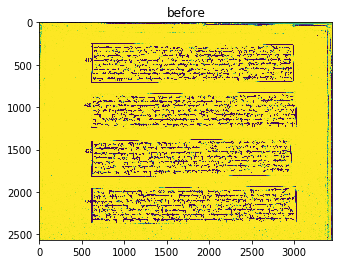

{4: 14, 2: 45, 1: 192, 3: 31}
threshold 2
[0, 242, 3451, 722]
[0, 817, 3451, 1259]
[0, 1364, 3451, 1827]
[0, 1922, 3451, 2378]
[0, 242, 3451, 787.5555555555555]


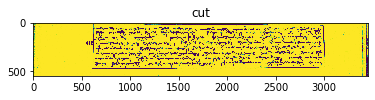

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00066-0.jpg !!!
[0, 751.4444444444445, 3451, 1324.5555555555557]


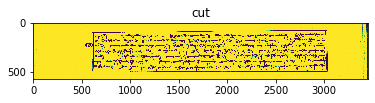

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00066-1.jpg !!!
[0, 1298.4444444444443, 3451, 1892.5555555555557]


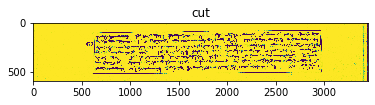

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00066-2.jpg !!!
[0, 1856.4444444444443, 3451, 2443.5555555555557]


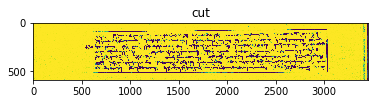

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00066-3.jpg !!!
image00067.jpg
(3442, 2573)
Processing image00067


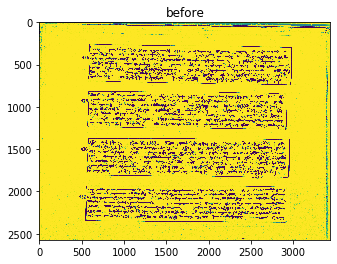

{4: 18, 3: 30, 2: 86, 1: 170}
threshold 2
[0, 255, 3442, 748]
[0, 810, 3442, 1273]
[0, 1363, 3442, 1849]
[0, 1924, 3442, 2375]
[0, 255, 3442, 798.4444444444445]


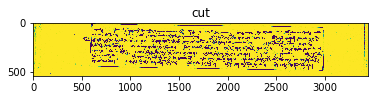

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00067-0.jpg !!!
[0, 759.5555555555555, 3442, 1323.4444444444443]


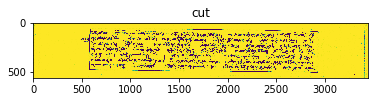

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00067-1.jpg !!!
[0, 1312.5555555555557, 3442, 1899.4444444444443]


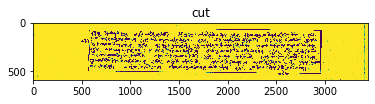

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00067-2.jpg !!!
[0, 1873.5555555555557, 3442, 2425.4444444444443]


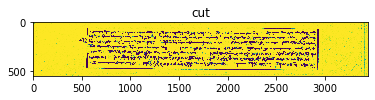

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00067-3.jpg !!!
image00068.jpg
(3413, 2562)
Processing image00068


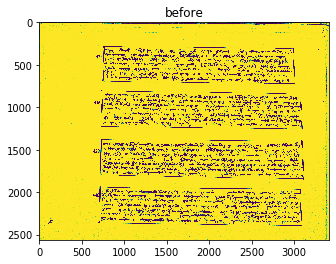

{4: 14, 1: 187, 2: 26, 3: 13}
threshold 2
[0, 278, 3413, 731]
[0, 801, 3413, 1264]
[0, 1373, 3413, 1851]
[0, 1933, 3413, 2401]
[0, 278, 3413, 789.0]


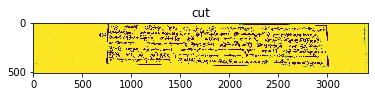

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00068-0.jpg !!!
[0, 743.0, 3413, 1322.0]


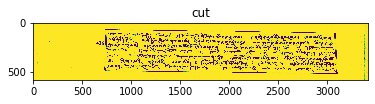

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00068-1.jpg !!!
[0, 1315.0, 3413, 1909.0]


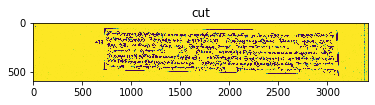

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00068-2.jpg !!!
[0, 1875.0, 3413, 2459.0]


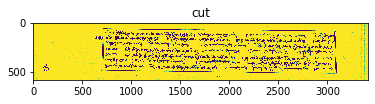

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00068-3.jpg !!!
image00069.jpg
(3427, 2564)
Processing image00069


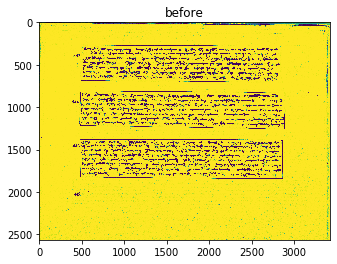

{4: 39, 2: 197, 3: 92, 1: 397}
threshold 2
[0, 262, 3427, 714]
[0, 803, 3427, 1267]
[0, 1370, 3427, 1853]
[0, 262, 3427, 778.0]


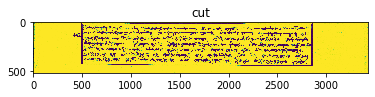

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00069-0.jpg !!!
[0, 739.0, 3427, 1331.0]


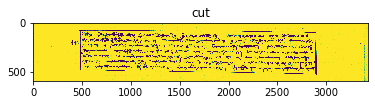

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00069-1.jpg !!!
[0, 1306.0, 3427, 1917.0]


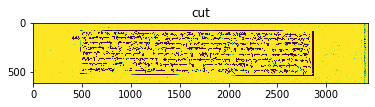

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00069-2.jpg !!!
image00070.jpg
(3445, 2557)
Processing image00070


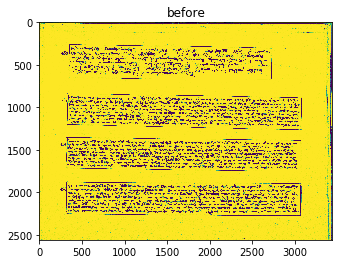

{3: 19, 2: 41, 4: 12, 1: 274}
threshold 2
[0, 256, 3445, 681]
[0, 833, 3445, 1271]
[0, 1344, 3445, 1759]
[0, 1868, 3445, 2281]
[0, 256, 3445, 741.6666666666666]


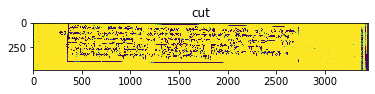

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00070-0.jpg !!!
[0, 772.3333333333334, 3445, 1331.6666666666667]


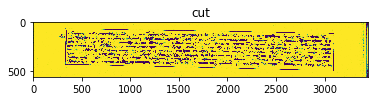

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00070-1.jpg !!!
[0, 1283.3333333333333, 3445, 1819.6666666666667]


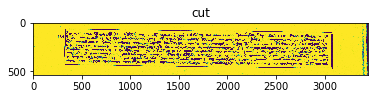

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00070-2.jpg !!!
[0, 1807.3333333333333, 3445, 2341.6666666666665]


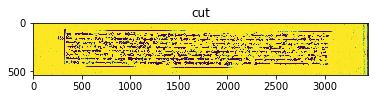

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00070-3.jpg !!!
image00071.jpg
(3446, 2556)
Processing image00071


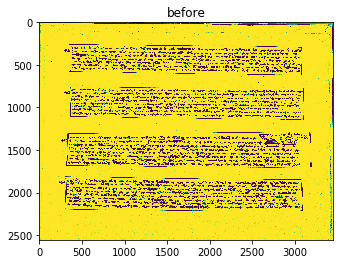

{1: 326, 4: 14, 3: 19, 2: 122}
threshold 2
[0, 254, 3446, 628]
[0, 751, 3446, 1153]
[0, 1281, 3446, 1714]
[0, 1804, 3446, 2226]
[0, 254, 3446, 703.7777777777778]


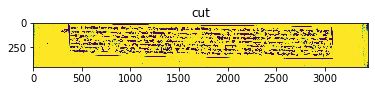

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00071-0.jpg !!!
[0, 675.2222222222222, 3446, 1228.7777777777778]


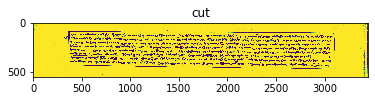

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00071-1.jpg !!!
[0, 1205.2222222222222, 3446, 1789.7777777777778]


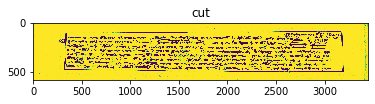

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00071-2.jpg !!!
[0, 1728.2222222222222, 3446, 2301.777777777778]


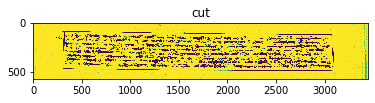

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00071-3.jpg !!!
image00072.jpg
(3446, 2563)
Processing image00072


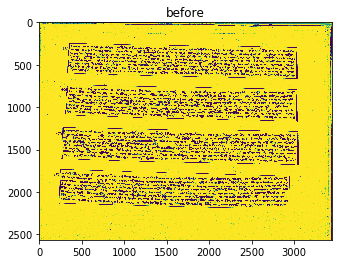

{2: 65, 4: 6, 1: 343, 3: 13}
threshold 2
[0, 243, 3446, 673]
[0, 729, 3446, 1174]
[0, 1231, 3446, 1687]
[0, 1725, 3446, 2199]
[0, 243, 3446, 706.5555555555555]


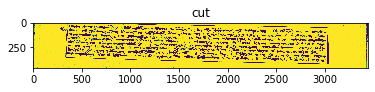

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00072-0.jpg !!!
[0, 695.4444444444445, 3446, 1207.5555555555557]


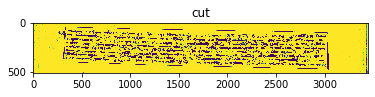

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00072-1.jpg !!!
[0, 1197.4444444444443, 3446, 1720.5555555555557]


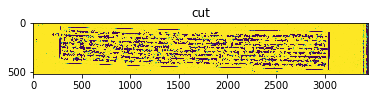

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00072-2.jpg !!!
[0, 1691.4444444444443, 3446, 2232.5555555555557]


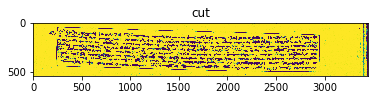

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00072-3.jpg !!!
image00073.jpg
(3433, 2559)
Processing image00073


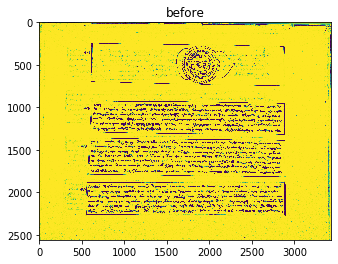

{4: 25, 3: 46, 2: 178, 1: 263}
threshold 2
[0, 240, 3433, 756]
[0, 892, 3433, 1328]
[0, 1341, 3433, 1825]
[0, 1871, 3433, 2274]
[0, 240, 3433, 799.3333333333334]


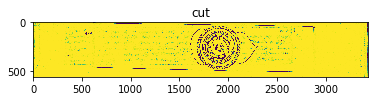

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00073-0.jpg !!!
[0, 848.6666666666666, 3433, 1371.3333333333333]


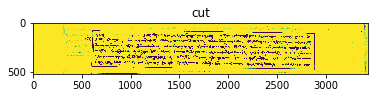

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00073-1.jpg !!!
[0, 1297.6666666666667, 3433, 1868.3333333333333]


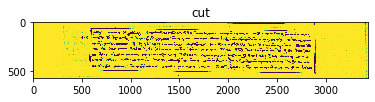

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00073-2.jpg !!!
[0, 1827.6666666666667, 3433, 2317.3333333333335]


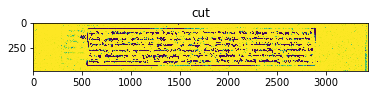

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00073-3.jpg !!!
image00074.jpg
(3423, 2564)
Processing image00074


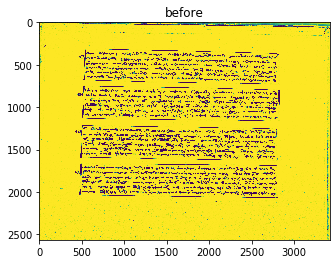

{3: 20, 1: 450, 2: 79, 4: 5}
threshold 2
[0, 308, 3423, 736]
[0, 745, 3423, 1171]
[0, 1209, 3423, 1633]
[0, 1659, 3423, 2076]
[0, 308, 3423, 752.2222222222222]


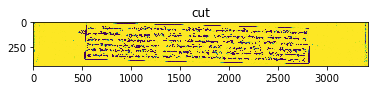

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00074-0.jpg !!!
[0, 728.7777777777778, 3423, 1187.2222222222222]


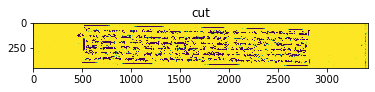

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00074-1.jpg !!!
[0, 1192.7777777777778, 3423, 1649.2222222222222]


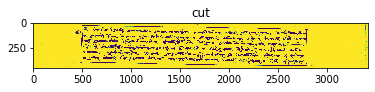

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00074-2.jpg !!!
[0, 1642.7777777777778, 3423, 2092.222222222222]


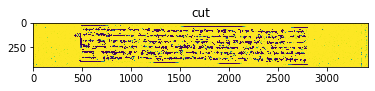

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00074-3.jpg !!!
image00075.jpg
(3435, 2560)
Processing image00075


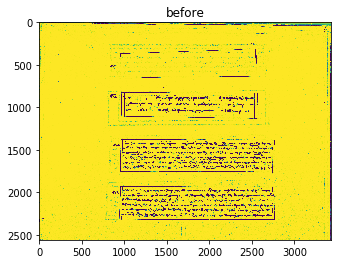

{3: 150, 2: 353, 4: 74, 1: 253}
threshold 2
[0, 816, 3435, 1141]
[0, 1368, 3435, 1773]
[0, 1852, 3435, 2332]
[0, 816, 3435, 1193.6666666666667]


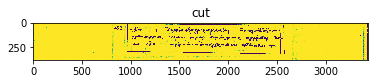

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00075-0.jpg !!!
[0, 1315.3333333333333, 3435, 1825.6666666666667]


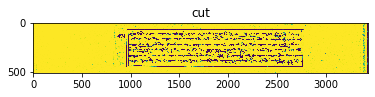

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00075-1.jpg !!!
[0, 1799.3333333333333, 3435, 2384.6666666666665]


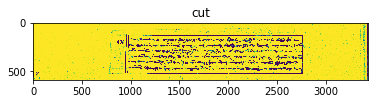

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00075-2.jpg !!!
image00076.jpg
(3443, 2547)
Processing image00076


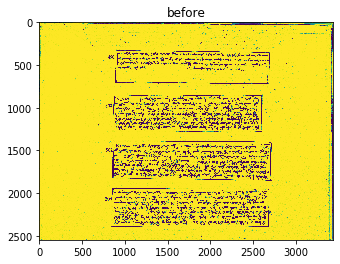

{2: 281, 3: 141, 1: 199, 4: 67}
threshold 2
[0, 10, 3443, 160]
[0, 302, 3443, 736]
[0, 845, 3443, 1289]
[0, 1382, 3443, 1859]
[0, 1935, 3443, 2407]
[0, 0, 3443, 230.0]


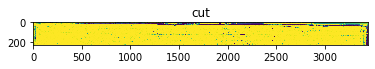

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00076-0.jpg !!!
[0, 232.0, 3443, 806.0]


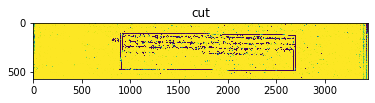

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00076-1.jpg !!!
[0, 775.0, 3443, 1359.0]


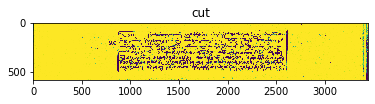

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00076-2.jpg !!!
[0, 1312.0, 3443, 1929.0]


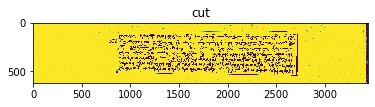

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00076-3.jpg !!!
[0, 1865.0, 3443, 2477.0]


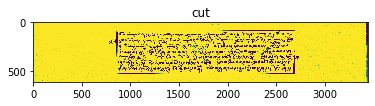

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00076-4.jpg !!!
image00077.jpg
(3431, 2558)
Processing image00077


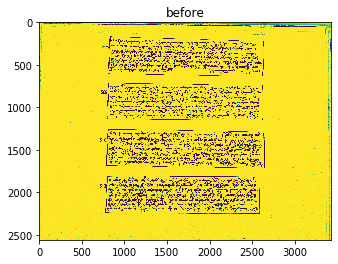

{3: 20, 2: 50, 1: 293, 4: 13}
threshold 2
[0, 165, 3431, 644]
[0, 709, 3431, 1160]
[0, 1251, 3431, 1723]
[0, 1797, 3431, 2258]
[0, 165, 3431, 695.1111111111111]


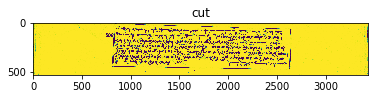

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00077-0.jpg !!!
[0, 657.8888888888889, 3431, 1211.111111111111]


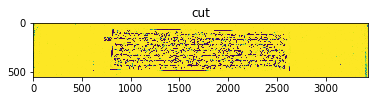

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00077-1.jpg !!!
[0, 1199.888888888889, 3431, 1774.111111111111]


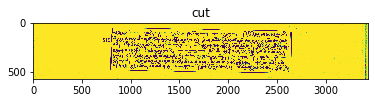

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00077-2.jpg !!!
[0, 1745.888888888889, 3431, 2309.1111111111113]


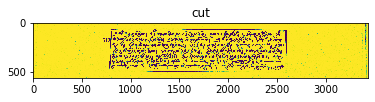

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00077-3.jpg !!!
image00078.jpg
(3439, 2552)
Processing image00078


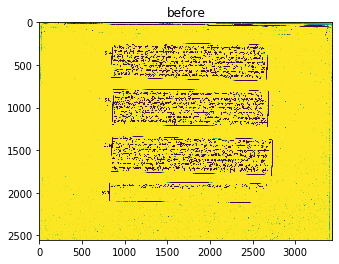

{3: 61, 4: 21, 1: 231, 2: 308}
threshold 2
[0, 234, 3439, 696]
[0, 778, 3439, 1229]
[0, 1327, 3439, 1799]
[0, 1863, 3439, 2129]
[0, 2263, 3439, 2467]
[0, 234, 3439, 759.0]


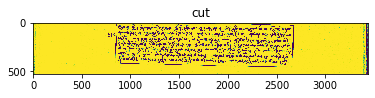

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00078-0.jpg !!!
[0, 715.0, 3439, 1292.0]


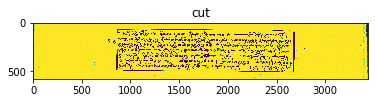

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00078-1.jpg !!!
[0, 1264.0, 3439, 1862.0]


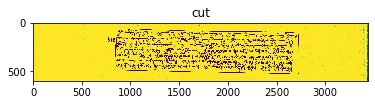

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00078-2.jpg !!!
[0, 1800.0, 3439, 2192.0]


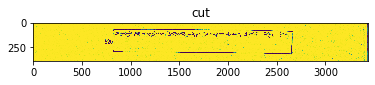

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00078-3.jpg !!!
[0, 2200.0, 3439, 2530.0]


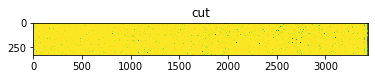

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00078-4.jpg !!!
image00079.jpg
(3438, 2547)
Processing image00079


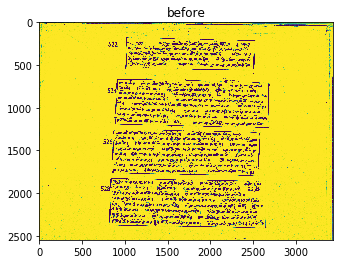

{4: 24, 3: 46, 2: 78, 1: 122}
threshold 2
[0, 10, 3438, 149]
[0, 174, 3438, 569]
[0, 660, 3438, 1241]
[0, 1251, 3438, 1805]
[0, 1819, 3438, 2417]
[0, 0, 3438, 172.33333333333334]


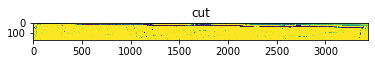

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00079-0.jpg !!!
[0, 150.66666666666666, 3438, 592.3333333333334]


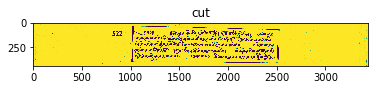

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00079-1.jpg !!!
[0, 636.6666666666666, 3438, 1264.3333333333333]


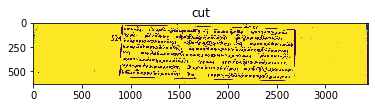

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00079-2.jpg !!!
[0, 1227.6666666666667, 3438, 1828.3333333333333]


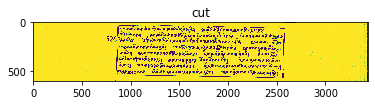

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00079-3.jpg !!!
[0, 1795.6666666666667, 3438, 2440.3333333333335]


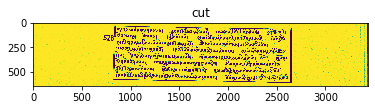

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00079-4.jpg !!!
image00080.jpg
(3439, 2544)
Processing image00080


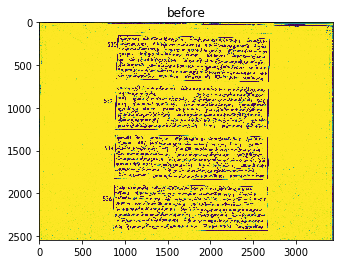

{3: 34, 4: 20, 2: 65, 1: 92}
threshold 2
[0, 147, 3439, 706]
[0, 741, 3439, 1266]
[0, 1310, 3439, 1850]
[0, 1892, 3439, 2450]
[0, 147, 3439, 732.8888888888889]


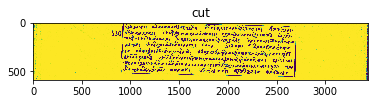

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00080-0.jpg !!!
[0, 714.1111111111111, 3439, 1292.888888888889]


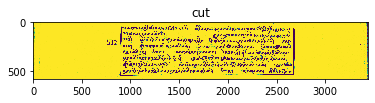

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00080-1.jpg !!!
[0, 1283.111111111111, 3439, 1876.888888888889]


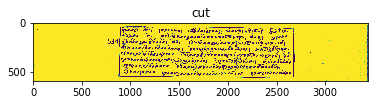

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00080-2.jpg !!!
[0, 1865.111111111111, 3439, 2476.8888888888887]


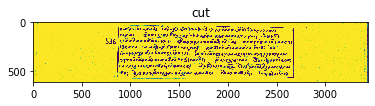

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00080-3.jpg !!!
image00081.jpg
(3444, 2546)
Processing image00081


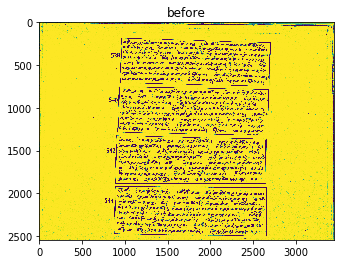

{3: 30, 4: 26, 2: 53, 1: 52}
threshold 2
[0, 181, 3444, 1898]
[0, 1911, 3444, 2534]
[0, 181, 3444, 1906.6666666666667]


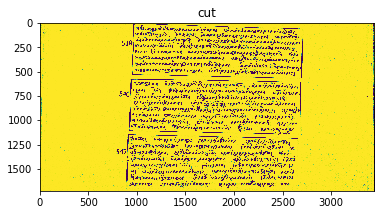

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00081-0.jpg !!!
[0, 1902.3333333333333, 3444, 2542.6666666666665]


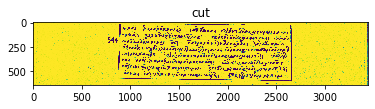

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00081-1.jpg !!!
image00081 Failed
image00082.jpg
(3431, 2569)
Processing image00082


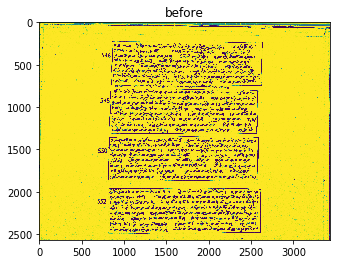

{4: 16, 3: 27, 2: 53, 1: 107}
threshold 2
[0, 221, 3431, 1328]
[0, 1341, 3431, 1883]
[0, 1948, 3431, 2502]
[0, 221, 3431, 1354.0]


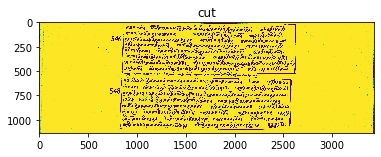

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00082-0.jpg !!!
[0, 1315.0, 3431, 1909.0]


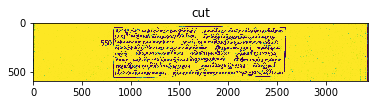

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00082-1.jpg !!!
[0, 1922.0, 3431, 2528.0]


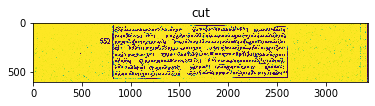

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00082-2.jpg !!!
image00083.jpg
(3440, 2543)
Processing image00083


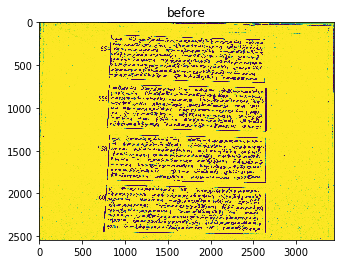

{3: 31, 2: 62, 1: 64, 4: 20}
threshold 2
[0, 106, 3440, 714]
[0, 723, 3440, 1283]
[0, 1307, 3440, 1882]
[0, 1892, 3440, 2482]
[0, 106, 3440, 723.5555555555555]


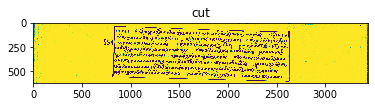

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00083-0.jpg !!!
[0, 713.4444444444445, 3440, 1292.5555555555557]


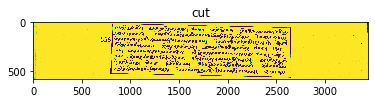

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00083-1.jpg !!!
[0, 1297.4444444444443, 3440, 1891.5555555555557]


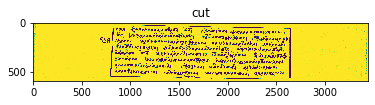

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00083-2.jpg !!!
[0, 1882.4444444444443, 3440, 2491.5555555555557]


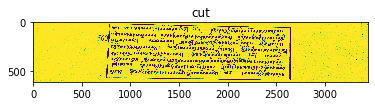

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00083-3.jpg !!!
image00084.jpg
(3424, 2577)
Processing image00084


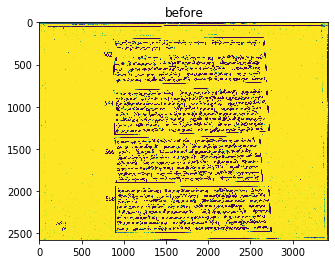

{1: 107, 4: 25, 2: 36, 3: 22}
threshold 2
[0, 173, 3424, 743]
[0, 768, 3424, 1909]
[0, 1932, 3424, 2503]
[0, 173, 3424, 759.0]


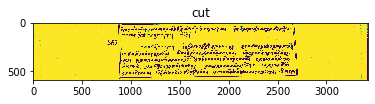

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00084-0.jpg !!!
[0, 752.0, 3424, 1925.0]


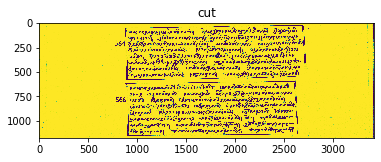

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00084-1.jpg !!!
[0, 1916.0, 3424, 2519.0]


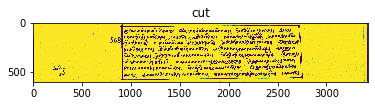

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00084-2.jpg !!!
image00085.jpg
(3421, 2547)
Processing image00085


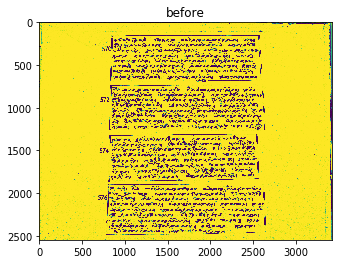

{3: 45, 1: 91, 4: 20, 2: 50}
threshold 2
[0, 146, 3421, 701]
[0, 726, 3421, 1275]
[0, 1302, 3421, 1867]
[0, 1883, 3421, 2493]
[0, 146, 3421, 716.1111111111111]


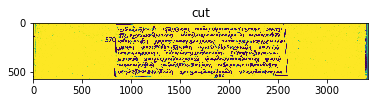

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00085-0.jpg !!!
[0, 710.8888888888889, 3421, 1290.111111111111]


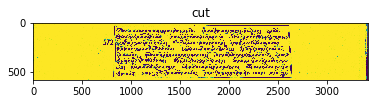

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00085-1.jpg !!!
[0, 1286.888888888889, 3421, 1882.111111111111]


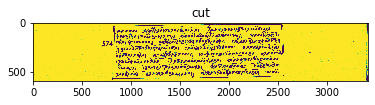

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00085-2.jpg !!!
[0, 1867.888888888889, 3421, 2508.1111111111113]


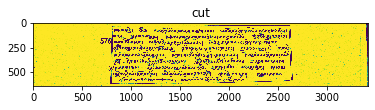

Saved Image as ../../../Tibetan-Cropped/BONPO_ABHISEKA_TEXTS/right_side/image00085-3.jpg !!!


In [0]:
# for all images in the image list, call crop()
for image_name in image_list:
  print(image_name)
  im = Image.open(image_name)
  print(im.size)
  crop(im, image_name[:-4], threshold)

In [0]:
print(failed_list)

['Copy of image00003', 'image00001', 'image00002', 'image00003', 'image00004', 'image00024', 'image00030', 'image00054', 'image00060', 'image00081']
